# Data loading and visualisation

In [1]:
from spectral import * 
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import imageio as io
from PIL import Image
import numpy as np

mpl.rc('image', cmap='terrain')
mpl.rcParams['text.color'] = 'grey'
mpl.rcParams['xtick.color'] = 'grey'
mpl.rcParams['ytick.color'] = 'grey'
mpl.rcParams['axes.labelcolor'] = 'grey'
plt.rcParams["font.family"] = "Laksaman"

def remove_ticks(ax):
    ax.set_xticks([]) 
    ax.set_yticks([]) 

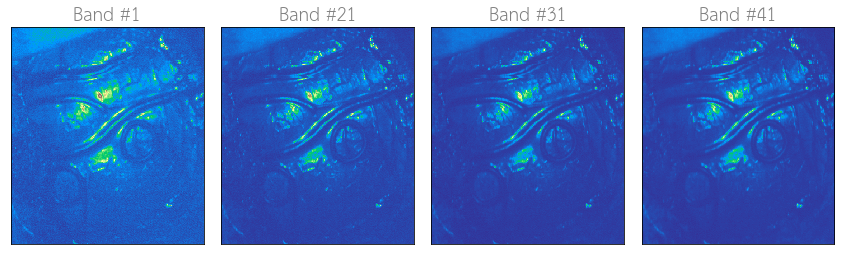

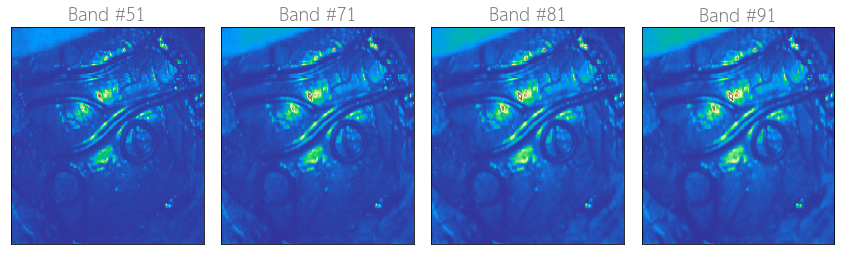

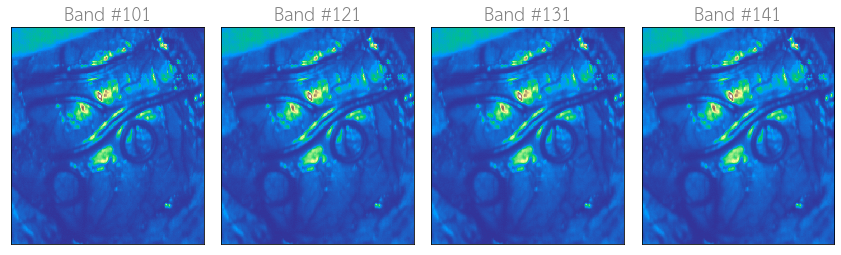

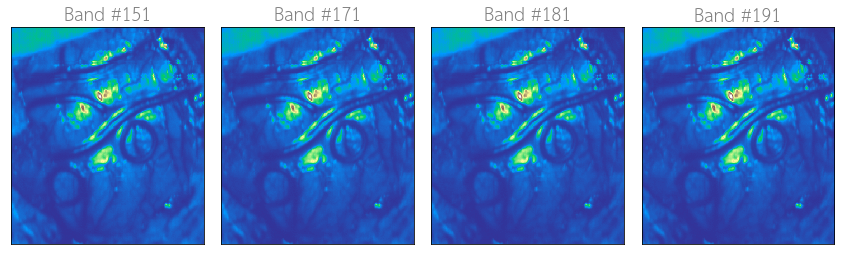

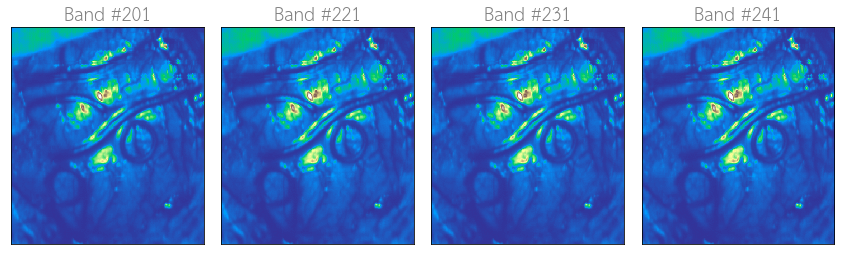

...

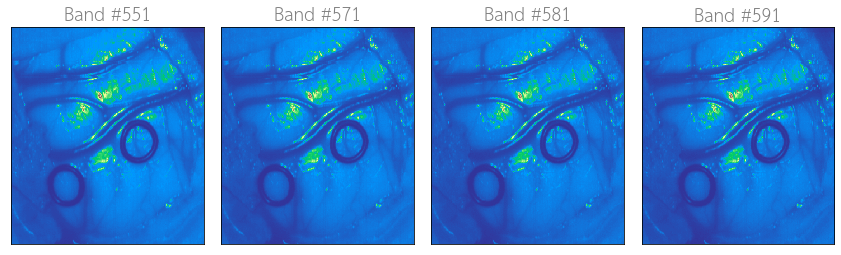

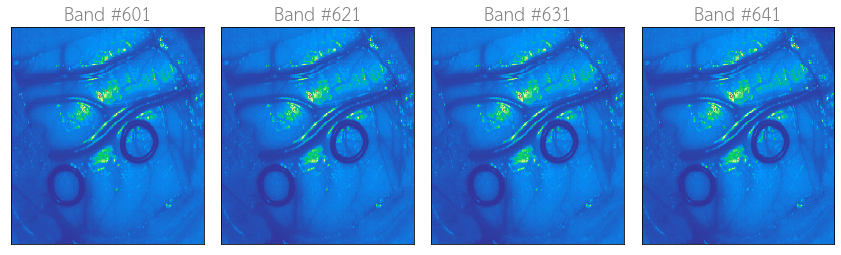

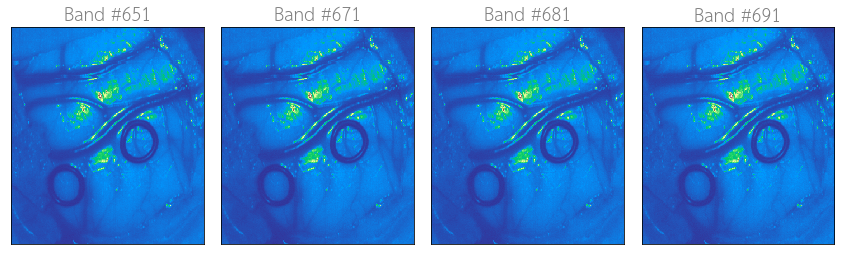

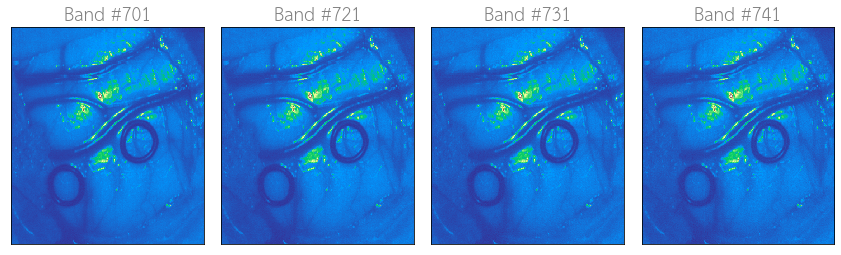

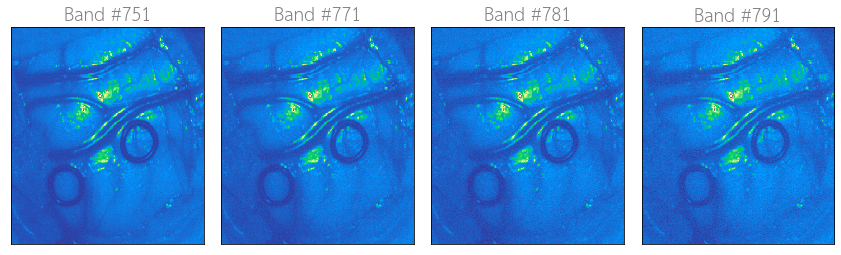

In [83]:
### There are 826 bands in the HELICoiD HSI cubes. We loop over and visualise them below

patient = "004-02"
hdr_path = "/home/ivan/aimlab/HELICoiD/HSI_Human_Brain_Database_IEEE_Access/{}/raw.hdr".format(patient)
img = open_image(hdr_path) 

for i in range(1,img.shape[-1]-50,50):

    
    fig, (ax, ax1, ax2, ax3) = plt.subplots(ncols=4,figsize=(15,4), 
            gridspec_kw={"width_ratios":[0.5,0.5,0.5,0.5]})
    fig.subplots_adjust(wspace=0.02)

    ax.imshow(img[:,:,i].squeeze())
    ax.set_title("Band #{}".format(i), fontsize=18)
    remove_ticks(ax)

    ax1.imshow(img[:,:,i+20].squeeze())
    ax1.set_title("Band #{}".format(i+20), fontsize=18)
    remove_ticks(ax1)

    ax2.imshow(img[:,:,i+30].squeeze())
    ax2.set_title("Band #{}".format(i+30), fontsize=18)
    remove_ticks(ax2)
    #ax2.imshow(mask2[:,:,110].T[10:220,15:225], cmap=cm.Dark2)

    ax3.imshow(img[:,:,i+40].squeeze())
    ax3.set_title("Band #{}".format(i+40), fontsize=18)
    remove_ticks(ax3)
    






/home/ivan/.local/lib/python3.8/site-packages/spectral/io/envi.py:175: UserWarning: Parameters with non-lowercase names encountered and converted to lowercase. To retain source file parameter name capitalization, set spectral.settings.envi_support_nonlowercase_params to True.
  warnings.warn(msg)


array([0., 1., 3., 4.], dtype=float32)

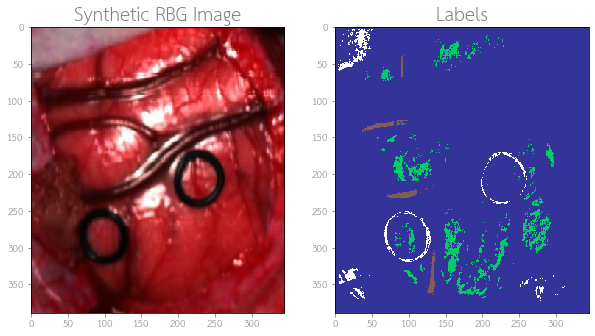

In [56]:
### Visualising a synthetic RBG and label map

## Image:
# The synthetic RGB image is generated by extracting three specific spectral bands from the HS cube with:
# red (708.97 nm), 
# green (539.44 nm), 
# and blue (479.06 nm) colors

## Labels:
# 0 = indicates pixels that are not labelled,
# 1 = Normal Tissue, 
# 2 = Tumour Tissue, 
# 3 = Hypervascularized Tissue, 
# 4 = Background

rbg_path = "/home/ivan/aimlab/HELICoiD/HSI_Human_Brain_Database_IEEE_Access/{}/image.jpg".format(patient)
rbg = Image.open(rbg_path)

gt_path = "/home/ivan/aimlab/HELICoiD/HSI_Human_Brain_Database_IEEE_Access/{}/gtMap.hdr".format(patient)
gt = open_image(gt_path)
gt = gt.load()


fig, (ax, ax1) = plt.subplots(ncols=2,figsize=(10,10))

ax.imshow(rbg)
ax.set_title("Synthetic RBG Image", fontsize=18)


ax1.imshow(gt[:,:,0].squeeze())
ax1.set_title("Labels", fontsize=18)

np.unique(gt)

Text(0.5, 1.0, 'RBG')

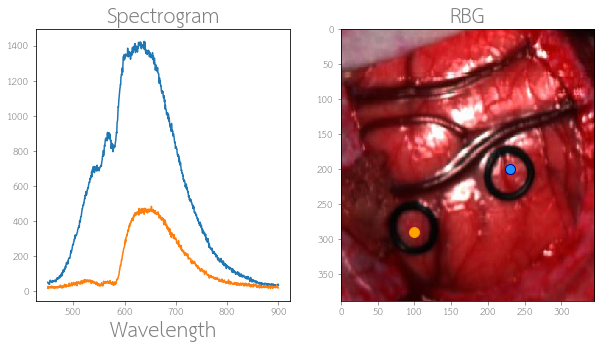

In [82]:
### Visualising spectrograms

intensity1 = []
intensity2 = []

blue_dot = [230,200]
orange_dot = [100,290]
wavelength = np.linspace(450, 900, 826)

for i in range(img.shape[-1]):
    intensity1.append(img[blue_dot[0],blue_dot[1],i])
    intensity2.append(img[orange_dot[0],orange_dot[1],i])

    
fig, (ax, ax1) = plt.subplots(ncols=2,figsize=(10,5))

ax.plot(wavelength, intensity1)
ax.set_xlabel("Wavelength", fontsize=20)
ax.plot(wavelength, intensity2)
#ax.set_xlabel("Wavelength", fontsize=20)
ax.set_title("Spectrogram", fontsize=20)
#ax.set_xlim(650,1000)

ax1.imshow(rbg, aspect="auto")
ax1.plot(blue_dot[0],blue_dot[1], marker="o", markersize=10, markeredgecolor="darkblue", markerfacecolor="dodgerblue")
ax1.plot(orange_dot[0],orange_dot[1], marker="o", markersize=10, markeredgecolor="darkorange", markerfacecolor="orange")
ax1.set_title("RBG", fontsize=20)   

Text(0.5, 1.0, 'Dark reference')

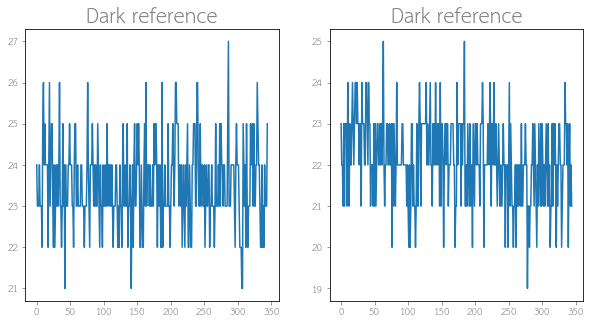

In [5]:
### Visualising dark and white reference

white_path = "/home/ivan/aimlab/HELICoiD/HSI_Human_Brain_Database_IEEE_Access/{}/whiteReference.hdr".format(patient)
white = open_image(white_path)
white = white.load()

dark_path = "/home/ivan/aimlab/HELICoiD/HSI_Human_Brain_Database_IEEE_Access/{}/darkReference.hdr".format(patient)
dark = open_image(dark_path)
dark = dark.load()


fig, (ax, ax1) = plt.subplots(ncols=2, figsize=(10,5))

ax.plot(dark[:,:,0].squeeze(0))
ax.set_title("Dark reference", fontsize=20)

ax1.plot(dark[:,:,400].squeeze(0))
ax1.set_title("Dark reference", fontsize=20)

(450, 900)

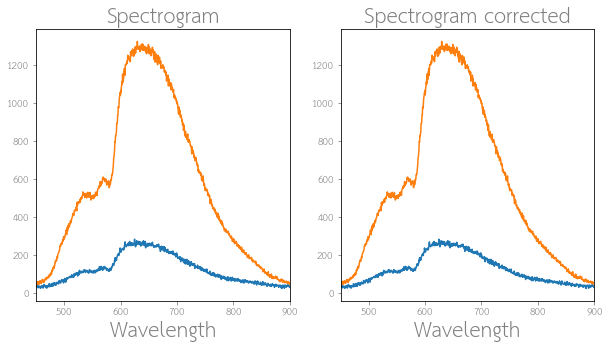

In [81]:
### Visualising spectrograms with calibration

intensity1_c = []
intensity2_c = []

wavelength = np.linspace(450, 900, 826)


for i in range(img.shape[-1]):
    # Raw data for white and dark calibration references comes as (1,345,826) array. It means we have 1d vector
    # for each of the 826 wavelngths.    
    # Here we form a 2d array (to match the HSI image size) for white and dark references out of the 1d data 
    # by repeating the 1d vector 389 times for the current wavelength in the loop. 
    # (1,345,826) --> (389,345) 
    
    white_full = np.tile(white[:,:,i].squeeze(0), (img.shape[0],1))
    dark_full = np.tile(dark[:,:,i].squeeze(0), img.shape[0])
    
    # Now we min-max normalize the white references. 
    # Note: it is still a question whether we should normalize our spectra to the white reference 
    # by division (as we do now) or by substraction.
    
    minw = np.min(white.squeeze(0))
    maxw = np.max(white.squeeze(0))
    ratio = maxw/minw
    white = (white - minw + 1) / (maxw - minw + 1)
    
    # We wanna calirate our HSI images w.r.t. white reference. Why? Because we saw by looking at the raw data that different 
    # wavelengths have different reflection from the white materila (i.e. reflecting 99% of light). So
    # we calibrate our HSI images 
    
    intensity1_c.append((img[170,120,i] - dark_full[170,120])*(1-white_full[170,120]))
    intensity2_c.append((img[250,120,i] - dark_full[250,120])*(1-white_full[250,120]))

    
fig, (ax, ax1) = plt.subplots(ncols=2,figsize=(10,5))

ax.plot(wavelength, intensity1)
ax.set_xlabel("Wavelength", fontsize=20)
ax.plot(wavelength, intensity2)
#ax.set_xlabel("Wavelength", fontsize=20)
ax.set_title("Spectrogram", fontsize=20)
ax.set_xlim(450,900)

ax1.plot(wavelength, intensity1)
ax1.set_xlabel("Wavelength", fontsize=20)
ax1.plot(wavelength, intensity2)
#ax.set_xlabel("Wavelength", fontsize=20)
ax1.set_title("Spectrogram corrected", fontsize=20)
ax1.set_xlim(450,900)

# Now we will build the compositions (absorption and scattering)

## First, we do absorption

In [8]:
# Calculate the absorption coefficient [cm^-1] of the tissue for the given wavelength:
# mu_a=mu_a_HbO2+mu_a_HHb+mu_a_H2O+mu_a_fat+mu_a_oxCCO+mu_a_redCCO

In [9]:
path_absorp = "/home/ivan/aimlab/UCL-NIR-Spectra/spectra/"
hbo2_absorp = path_absorp + "hb02.txt"
hhb_absorp = path_absorp + "hb.txt"
water_absorp = path_absorp + "matcher94_nir_water_37.txt"
diff_cyto_absorp = path_absorp + "cytoxidase_diff_odmMcm.txt"
fat_absorp = path_absorp + "fat.txt"
cyto_oxy_absorp = path_absorp + "moody cyt aa3 oxidised.txt"
cyto_red_absorp = path_absorp + "moody cyt aa3 reduced.txt"

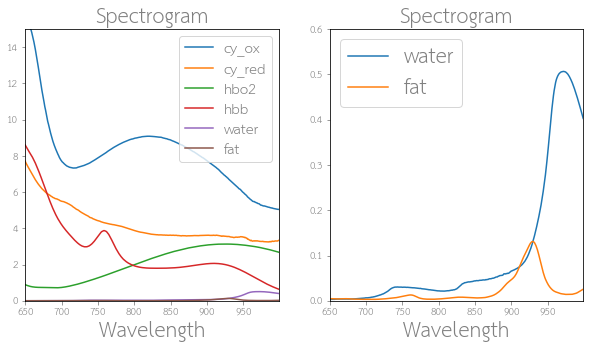

In [26]:
### reading cpectra from .txt
def read_spectra(file_name):
    with open(file_name, 'r') as data:
        x = []
        y = []
        for line in data:
            p = line.split()
            x.append(float(p[0]))
            y.append(float(p[1]))

    return x, y

x_cox, y_cox = read_spectra(cyto_oxy_absorp) # cytochrome oxydised
x_cred, y_cred = read_spectra(cyto_red_absorp) # cytochrome reduced
x_hbo2, y_hbo2 = read_spectra(hbo2_absorp) # oxyhemoglobin
x_hbb, y_hbb = read_spectra(hhb_absorp) # hemoglobin
x_water, y_water = read_spectra(water_absorp) # water
x_fat, y_fat = read_spectra(fat_absorp)

y_cox = [i * 2.3025851 for i in y_cox] # from extinction to absorption  
y_cred = [i * 2.3025851 for i in y_cred] # from extinction to absorption  
y_water = [i * 2.3025851 for i in y_water] # from extinction to absorption  
y_hbo2 = [i * 10 * 1000 for i in y_hbo2] # from mm and micromole to cm and minimole 
y_hbb = [i * 10 * 1000 for i in y_hbb] # from mm and micromole to cm and minimole
y_fat = [i / 100 for i in y_fat] # from m to cm 


# cutting all spectra to the range 650 - 1000 nm
left_cut = 650
right_cut = 999

import bisect
ix_left = x_cox.index(left_cut)
ix_right = x_cox.index(right_cut)
x = x_cox[bisect.bisect_left(x_cox, left_cut):bisect.bisect_right(x_cox, right_cut)]
y_cox = y_cox[ix_left:ix_right+1]

ix_left = x_cred.index(left_cut)
ix_right = x_cred.index(right_cut)
y_cred = y_cred[ix_left:ix_right+1]

ix_left = x_water.index(left_cut)
ix_right = x_water.index(right_cut)
y_water = y_water[ix_left:ix_right+1]

ix_left = x_hbo2.index(left_cut)
ix_right = x_hbo2.index(right_cut)
y_hbo2 = y_hbo2[ix_left:ix_right+1]

ix_left = x_hbb.index(left_cut)
ix_right = x_hbb.index(right_cut)
y_hbb = y_hbb[ix_left:ix_right+1]

ix_left = x_fat.index(left_cut)
ix_right = x_fat.index(right_cut)
y_fat = y_fat[ix_left:ix_right+1]


### Visualising spectrograms of chromophores
fig, (ax, ax1) = plt.subplots(ncols=2,figsize=(10,5))

ax.plot(x, y_cox, label='cy_ox')
ax.set_xlabel("Wavelength", fontsize=20)
ax.plot(x, y_cred, label='cy_red')
ax.plot(x, y_hbo2, label='hbo2')
ax.plot(x, y_hbb, label='hbb')
ax.plot(x, y_water, label='water')
ax.plot(x, y_fat, label='fat')
ax.set_title("Spectrogram", fontsize=20)
ax.set_xlim(left_cut, right_cut)
ax.set_ylim(0, 15)
ax.legend(fontsize=14)


ax1.plot(x, y_water, label='water')
ax1.set_xlabel("Wavelength", fontsize=20)
ax1.plot(x, y_fat, label='fat')
#ax.set_xlabel("Wavelength", fontsize=20)
ax1.set_title("Spectrogram", fontsize=20)
ax1.set_xlim(left_cut, right_cut)
ax1.set_ylim(0, 0.6)
ax1.legend(fontsize=20)


maxpicks = {"w": np.max(y_water), "f": np.max(y_fat), "hbo2": np.max(y_hbo2), "hbb": np.max(y_hbb), 
            "cox": np.max(y_cox), "cred":np.max(y_cred)}
#maxpicks

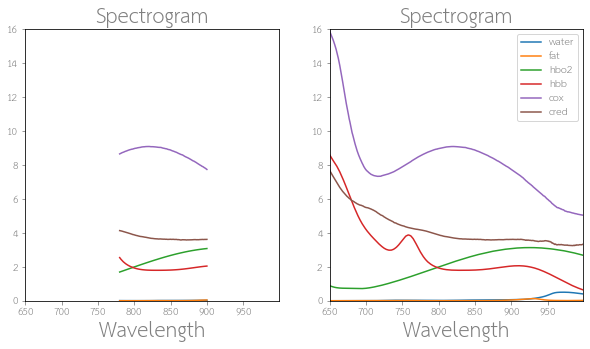

In [27]:
### reading spectra from Luca's paper directly
### careful about water absorption (I guess it is extinction instead)

def read_spectra_all(file_name):
    with open(file_name, 'r') as data:
        x = []
        y1 = []
        y2 = []
        y3 = []
        y4 = []
        y5 = []
        y6 = []
        y7 = []
        for line in data:
            p = line.split()
            x.append(float(p[0]))
            y1.append(float(p[1]))
            y2.append(float(p[2]))
            y3.append(float(p[3]))
            y4.append(float(p[4]))
            y5.append(float(p[5]))
            y6.append(float(p[6]))
            y7.append(float(p[7]))

    return x, y1, y2, y3, y4, y5, y6, y7

x1, yw, yf, yhox, yh, ycox, ycred, ydiff = read_spectra_all("/home/ivan/aimlab/UCL-NIR-Spectra/spectra/all-in-one.txt")

yhox = [i * 2.3025851 / 1000 for i in yhox] # from extinction to absorption  
yh = [i * 2.3025851 / 1000 for i in yh] # from extinction to absorption  
ycox = [i * 2.3025851 / 1000 for i in ycox] # from extinction to absorption  
ycred = [i * 2.3025851 / 1000 for i in ycred] # from mm and micromole to cm and minimole 

### Visualising spectrograms of chromophores from Luca's paper
fig, (ax, ax1) = plt.subplots(ncols=2,figsize=(10,5))

ax.plot(x1, yw)
ax.set_xlabel("Wavelength", fontsize=20)
ax.plot(x1, yf)
ax.plot(x1, yhox)
ax.plot(x1, yh)
ax.plot(x1, ycox)
ax.plot(x1, ycred)
ax.set_title("Spectrogram", fontsize=20)
ax.set_xlim(left_cut,right_cut)
ax.set_ylim(0, 16)


ax1.set_xlabel("Wavelength", fontsize=20)

ax1.plot(x, y_water, label='water')
ax1.plot(x, y_fat, label='fat')
ax1.plot(x, y_hbo2, label='hbo2')
ax1.plot(x, y_hbb, label='hbb')
ax1.plot(x, y_cox, label='cox')
ax1.plot(x, y_cred, label='cred')

ax1.set_title("Spectrogram", fontsize=20)
ax1.set_xlim(left_cut,right_cut)
ax1.set_ylim(0, 16)
ax1.legend()


## Now scattering

In [28]:
# mu_s = mu_s_blood_vessel + mu_s_white_matter + mu_s_grea_matter

In [29]:
# b and g for whole blood, cortex (gm), and cerebellar white matter (wm) 
# from Jacques 2013: Optical properties of bilogical tissues 

# scattering power
b_blood = 0.660
b_gm = 0.334
b_wm = 1.629

# anisotropy
g_blood = 0.9 # from https://omlc.org/spectra/aorta/
g_gm = 0.9 # from a blue
g_wm = 0.9 # same


mu_s_r_blood = np.power(np.divide(x,500),-b_blood) # Reduced scattering coefficient of the tissue [cm^-1];
mu_s_blood = mu_s_r_blood/(1-g_blood)              # Scattering coefficient of the tissue [cm^-1];

mu_s_r_gm = np.power(np.divide(x,500),-b_gm)
mu_s_gm = mu_s_r_gm/(1-g_gm)

mu_s_r_wm = np.power(np.divide(x,500),-b_wm)
mu_s_wm = mu_s_r_wm/(1-g_wm)

(0, 10)

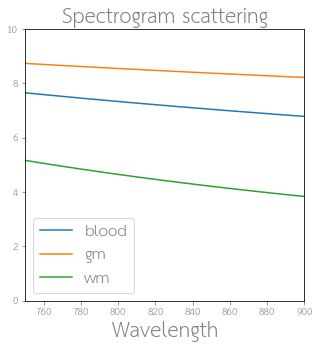

In [30]:
### Visualising spectrograms of tissue scattering
fig, ax = plt.subplots(ncols=1,figsize=(5,5))

ax.plot(x, mu_s_blood, label="blood")
ax.set_xlabel("Wavelength", fontsize=20)
ax.plot(x, mu_s_gm, label="gm")
ax.plot(x, mu_s_wm, label="wm")
ax.legend(fontsize=16)
ax.set_title("Spectrogram scattering", fontsize=20)
ax.set_xlim(750,900)
ax.set_ylim(0, 10)

# Good, now we proceed to the optimisation

In [31]:
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit, Bounds
from scipy.optimize import brute, differential_evolution

In [32]:
# build a synthetic spectra (with fixed parameters) to validate accuracy of optimization
a_w=0.05 
a_f=0.07 
a_hbo2=0.8 
a_hbb=0.1
a_cox=0.01 
a_cred=0.02 
s_blood=0.03 
s_wm=0.04
s_gm=0.05

(650, 999)

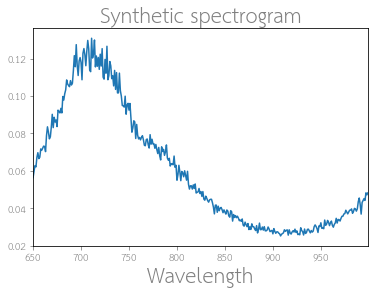

In [33]:
# 9 parameters: 6 absorption and 3 scattering

def func_array(x, a_w, a_f, a_hbo2, a_hbb, a_cox, a_cred, s_blood, s_wm, s_gm):
    y = []
    
    for xx in x:
        #print(xx)
        xx = int(xx) - left_cut
        #print(xx)
        m_a = a_w*np.asarray(y_water[xx]) + a_f*np.asarray(y_fat[xx]) + a_hbo2*np.asarray(y_hbo2[xx]) \
             + a_hbb*np.asarray(y_hbb[xx]) + a_cox*np.asarray(y_cox[xx]) + a_cred*np.asarray(y_cred[xx])
        m_s = s_blood*np.asarray(mu_s_blood[xx]) + s_wm*np.asarray(mu_s_wm[xx]) + s_gm*np.asarray(mu_s_gm[xx])
        
        exp_m = np.exp(- m_a - m_s)
        
        sp = exp_m**2  # signal Power
        snr = 600 # signal to noise ratio
        std_n = ( sp / snr )**0.5 # noise std. deviation
                
        y.append(exp_m + np.random.normal(0, std_n, 1)[0])

        
    return y # I = I_o * exp(-(m_a+m_s)x)  


synth_spect2 = func_array(x, a_w, a_f, a_hbo2, a_hbb, a_cox, a_cred, s_blood, s_wm, s_gm)

### Visualising synthetic spectrogram
plt.plot(x, synth_spect2)
plt.xlabel("Wavelength", fontsize=20)
plt.title("Synthetic spectrogram", fontsize=20)
plt.xlim(left_cut, right_cut)
#ax.set_ylim(0, 10)

   Iteration     Total nfev        Cost      Cost reduction    Step norm     Optimality   
       0              1         7.8149e-01                                    2.11e+03    
       1              2         7.8135e-01      1.38e-04       2.65e-06       5.58e+03    
       2              5         7.8135e-01      7.07e-06       1.09e-07       4.55e+03    
       3              7         7.8135e-01      0.00e+00       0.00e+00       4.55e+03    
`xtol` termination condition is satisfied.
Function evaluations 7, initial cost 7.8149e-01, final cost 7.8135e-01, first-order optimality 4.55e+03.
[0.04999918 0.04999962 0.49999978 0.04999898 0.04999941 0.04999964
 0.05000185 0.05000028 0.50000103]


Text(0.5, 1.0, 'Inferred spectrogram')

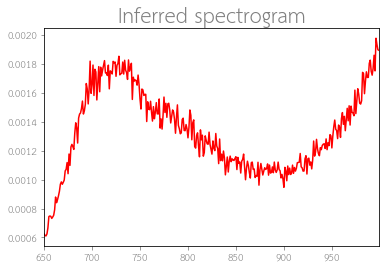

In [34]:
# Now we do least-squared curve fitting
popt, pcov = curve_fit(func_array, x, synth_spect2, bounds=(0, [0.1, 0.1, 1., 0.1, 0.1, 0.1, 0.1, 0.1, 1.]),
                      method='trf', verbose=2)
print(popt)
plt.plot(x, func_array(x, *popt), 'r-')
plt.xlim(left_cut, right_cut)
plt.title("Inferred spectrogram", fontsize=20)
#ax.set_ylim(0, 10)

# a_w=0.05 
# a_f=0.07 
# a_hbo2=0.8 
# a_hbb=0.1
# a_cox=0.01 
# a_cred=0.02 

# s_blood=0.03 
# s_wm=0.04
# s_gm=0.05

# Questions:
1. why cytochrome spectra are different (e.g. Moody is quite different from Cooper)
2. where to get g (anisotrophy) for white,grey matter and blood
3. what are physiologically plausible bounds
4. dictionary between composition coefficients and biomarkers
5. how reasonable to do MCMM and parametric optimisation (local or global) time-wise for real time?
6. Illuminate only in the ranges where it is orthogonal? Is it possible? If yes, I will do slide window to find the more orthogonal interval 
7. Can we use smaller number of spectra? Need to know the contribution of each

## Now we generate a dataset of 10^6 spectra with uniformly distributed parameters

In [43]:
def func_array(x, a_w, a_f, a_hbo2, a_hbb, a_cox, a_cred, s_blood, s_wm, s_gm):
    y = []
    
    for xx in x:
        #print(xx)
        xx = int(xx) - left_cut
        #print(xx)
        m_a = a_w*np.asarray(y_water[xx]) + a_f*np.asarray(y_fat[xx]) + a_hbo2*np.asarray(y_hbo2[xx]) \
             + a_hbb*np.asarray(y_hbb[xx]) + a_cox*np.asarray(y_cox[xx]) + a_cred*np.asarray(y_cred[xx])
        m_s = s_blood*np.asarray(mu_s_blood[xx]) + s_wm*np.asarray(mu_s_wm[xx]) + s_gm*np.asarray(mu_s_gm[xx])
        
        exp_m = np.exp(- m_a - m_s)
        
        sp = exp_m**2 #signal power
        snr = 1e6 #signal to noise ratio
        std_n = ( sp / snr )**0.5 #noise std. deviation
                
        y.append(exp_m + np.random.normal(0, std_n, 1)[0])

        
    return y # I = I_o * exp(-(m_a+m_s)x)  

number_of_samples = int(100)

### sample randomly coefficients of the composition
# absorption
a_w = np.random.uniform(0,0.1,number_of_samples)
a_f = np.random.uniform(0,0.01,number_of_samples)
a_hbo2 = np.random.uniform(0,0.01,number_of_samples)
a_hbb = np.random.uniform(0,0.01,number_of_samples)
a_ctotal = np.random.uniform(0,0.01,number_of_samples) # cred is dependent as cox + cred stay the same
a_cred = []
for item in a_ctotal: # cred is dependent as cox + cred stay the same
    a_cred.append(np.random.uniform(0,item,1)[0])
a_cred = np.asarray(a_cred)

# scattering
s_blood = np.random.uniform(0,0.01,number_of_samples)
s_wm = np.random.uniform(0,0.01,number_of_samples)
s_gm = np.random.uniform(0,0.01,number_of_samples)

# Now we create the dataset by plugging the sampled coefficients
path_s = "/home/ivan/aimlab/HELICoiD/synthetic_data/" # path where we store the dataset
for i in range(len(a_w)): 
    synth_spect_dataset = func_array(x, a_w[i], a_f[i], a_hbo2[i], a_hbb[i], a_ctotal[i]-a_cred[i], a_cred[i], s_blood[i], s_wm[i], s_gm[i]) 
    synth_spect_params = [a_w[i], a_f[i], a_hbo2[i], a_hbb[i], a_ctotal[i]-a_cred[i], a_cred[i], s_blood[i], s_wm[i], s_gm[i]]
    np.savez_compressed(path_s + "y_and_params/" + str(i), spectra=synth_spect_dataset, params=synth_spect_params)
np.savez_compressed(path_s + "x", x=x)


[0.03898144 0.00309701 0.00936714 0.00044727 0.00229919 0.00269649
 0.0007274  0.00724841 0.00142686]
(350,)
(350,)


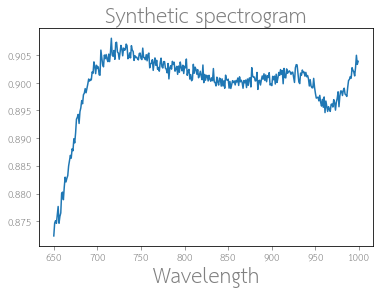

[0.02824589 0.00496489 0.00393227 0.00532135 0.00017001 0.00762805
 0.00438286 0.0041834  0.00932427]
(350,)
(350,)


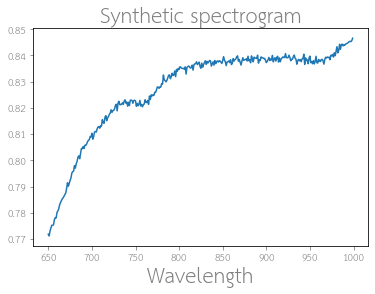

[0.04050289 0.00286636 0.00402731 0.00620556 0.00177201 0.00042732
 0.00710729 0.00376244 0.00337171]
(350,)
(350,)


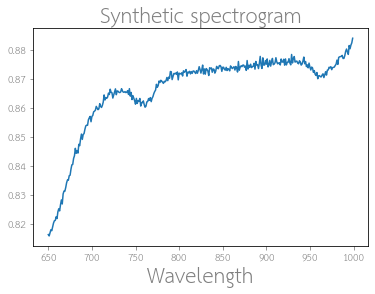

[0.09587665 0.00916742 0.00479545 0.0075418  0.00215707 0.00041889
 0.00393788 0.00394262 0.00078829]
(350,)
(350,)


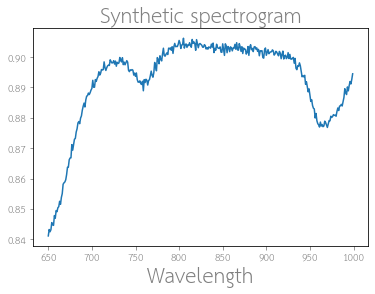

[0.0514307  0.00858169 0.00980415 0.00207824 0.00313297 0.00683905
 0.00161286 0.00981059 0.00104185]
(350,)
(350,)


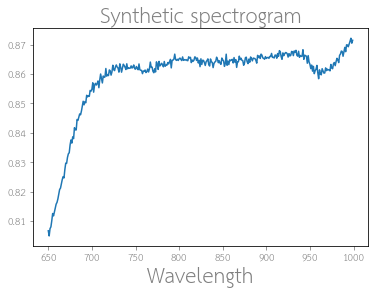

[0.08948331 0.00267301 0.00865855 0.00314974 0.00070593 0.00633141
 0.00375371 0.00149977 0.0081043 ]
(350,)
(350,)


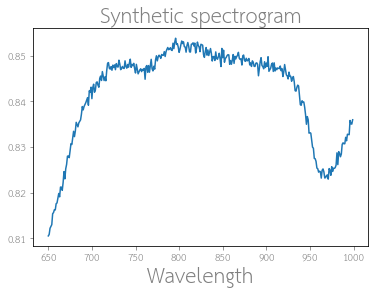

[0.03482577 0.00024123 0.00186422 0.00708647 0.0002819  0.00086439
 0.00702231 0.00751476 0.00544551]
(350,)
(350,)


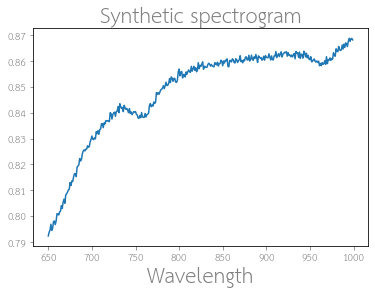

[0.07256314 0.00339245 0.00378471 0.0081378  0.00229585 0.00430927
 0.00877372 0.00377471 0.00127156]
(350,)
(350,)


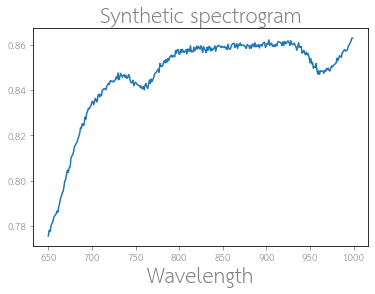

[0.02421947 0.00708327 0.00415664 0.00071553 0.00081844 0.00471341
 0.00483892 0.00262706 0.00317082]
(350,)
(350,)


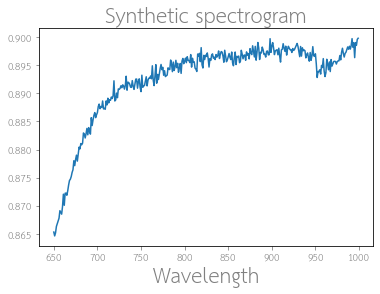

[0.09959872 0.00631796 0.00155325 0.0032743  0.00033001 0.00032805
 0.00979352 0.00119605 0.00092427]
(350,)
(350,)


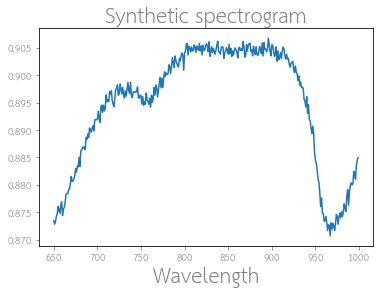

[0.05480946 0.00190176 0.00632201 0.00899088 0.00041465 0.00299619
 0.00584021 0.00192898 0.00399735]
(350,)
(350,)


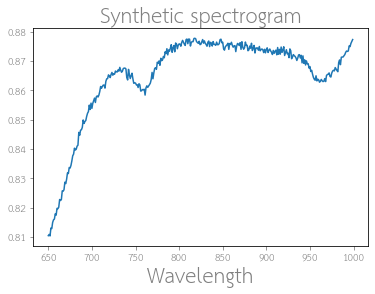

[0.07572505 0.00169715 0.00204077 0.00833093 0.00056923 0.00510757
 0.00471557 0.00504552 0.00858819]
(350,)
(350,)


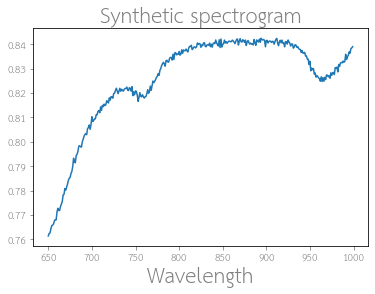

[0.05551287 0.00431728 0.00829507 0.00889906 0.00024389 0.00093684
 0.00851865 0.00753801 0.00533149]
(350,)
(350,)


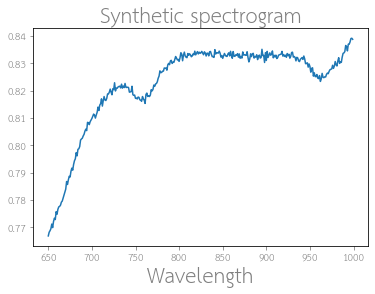

[0.0931592  0.00877682 0.00996061 0.00204576 0.00038158 0.00674969
 0.00864221 0.00064973 0.00340649]
(350,)
(350,)


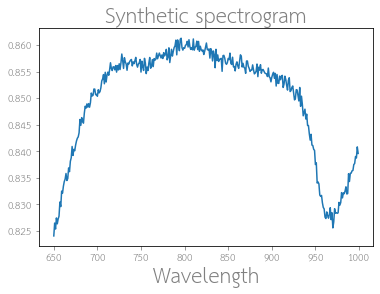

[0.00765783 0.00757448 0.00745269 0.00857298 0.00367262 0.00384911
 0.00422124 0.00363463 0.00907319]
(350,)
(350,)


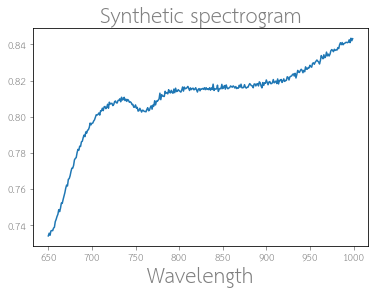

[3.98333344e-02 9.08168520e-03 4.04616377e-03 7.79634856e-03
 1.16160084e-03 4.86160810e-03 7.92605687e-03 8.97087270e-03
 5.84813787e-05]
(350,)
(350,)


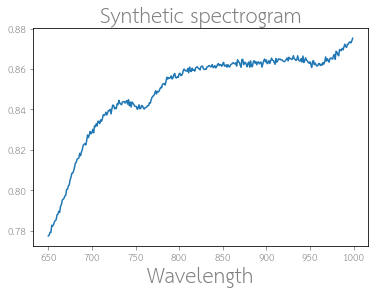

[7.51451399e-02 6.30839174e-04 4.46099788e-04 8.02459083e-04
 3.15763222e-03 5.60903861e-05 3.36212469e-03 5.69487311e-04
 6.27698245e-03]
(350,)
(350,)


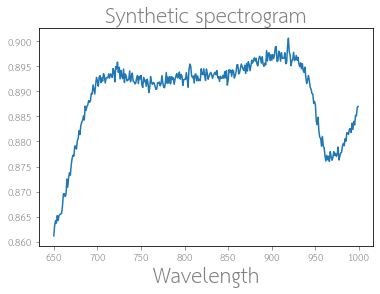

[0.00345531 0.00779443 0.00420624 0.00962461 0.00227371 0.00311625
 0.00899257 0.0040395  0.00910053]
(350,)
(350,)


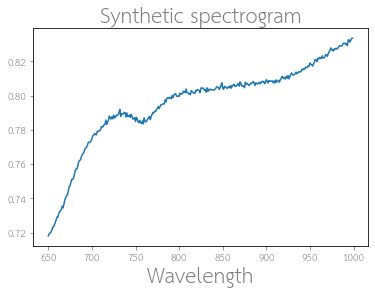

[0.0285467  0.00186892 0.00843484 0.0041694  0.00471792 0.00217715
 0.0068452  0.00168583 0.00565279]
(350,)
(350,)


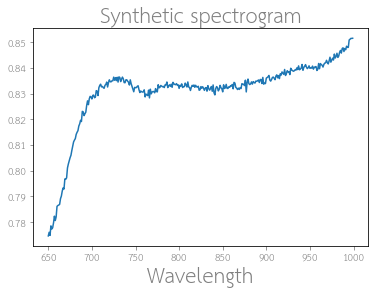

[0.03288357 0.00054414 0.00929464 0.00759497 0.00109494 0.00465157
 0.00813126 0.00235577 0.003639  ]
(350,)
(350,)


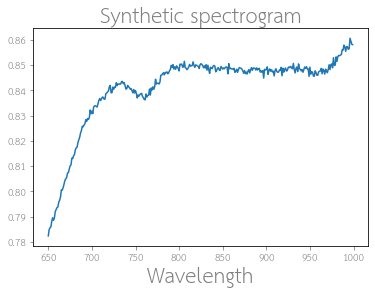

[0.00549948 0.00269393 0.00037555 0.00521194 0.00113141 0.00082075
 0.00281913 0.00568271 0.00726283]
(350,)
(350,)


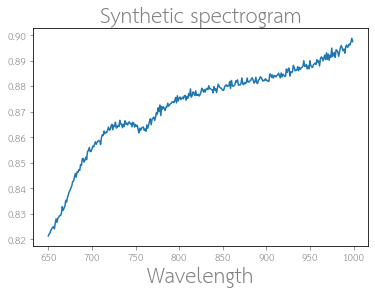

[0.02321198 0.00402099 0.00172401 0.00426623 0.00261096 0.00317202
 0.00726196 0.00283306 0.00304391]
(350,)
(350,)


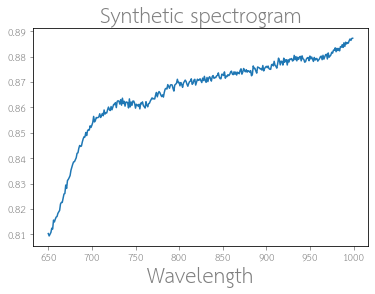

[0.08693776 0.0084052  0.00675082 0.00462663 0.00021701 0.00055035
 0.00995385 0.00593093 0.00325234]
(350,)
(350,)


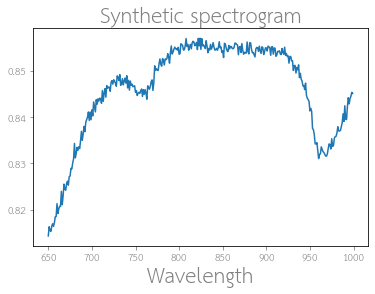

[0.01684436 0.00334376 0.00771279 0.0021     0.00341289 0.00044846
 0.00381618 0.00507765 0.00654811]
(350,)
(350,)


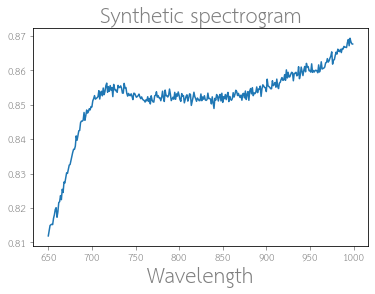

[0.07032838 0.00751421 0.00169478 0.00911615 0.00027245 0.00045076
 0.00292597 0.00308817 0.00580536]
(350,)
(350,)


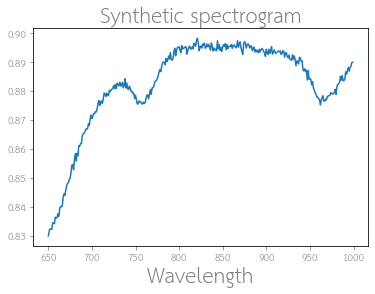

[0.09388707 0.0050343  0.00587275 0.00346281 0.00406215 0.00040587
 0.00419629 0.00183109 0.00980878]
(350,)
(350,)


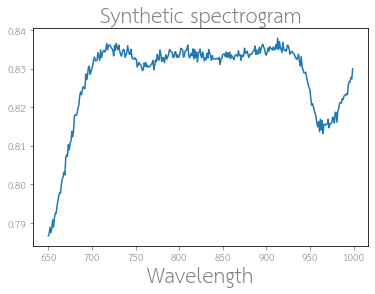

[0.09741602 0.00185889 0.00541577 0.00658924 0.0001954  0.00276894
 0.00394827 0.00479186 0.002714  ]
(350,)
(350,)


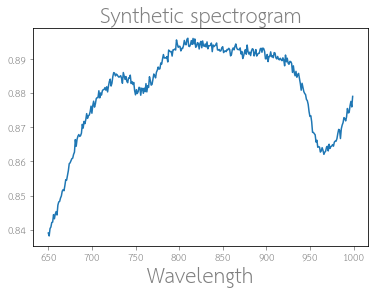

[0.07979426 0.00056332 0.00493554 0.00845954 0.00208536 0.00045103
 0.00328329 0.00852821 0.002191  ]
(350,)
(350,)


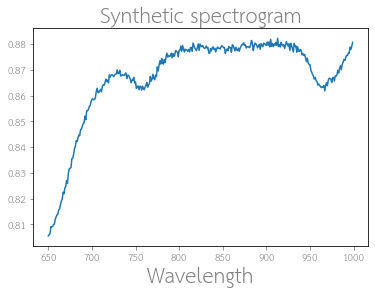

[0.08881995 0.00753121 0.00661633 0.00054062 0.00315128 0.00508947
 0.00672196 0.00749254 0.00790953]
(350,)
(350,)


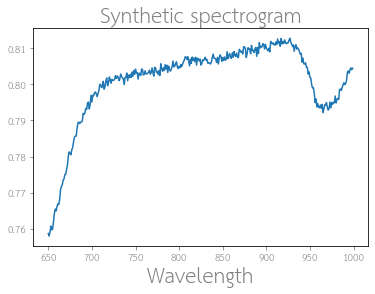

[0.06532069 0.00894274 0.00553555 0.00131687 0.00132057 0.00441167
 0.00180245 0.00885347 0.00808468]
(350,)
(350,)


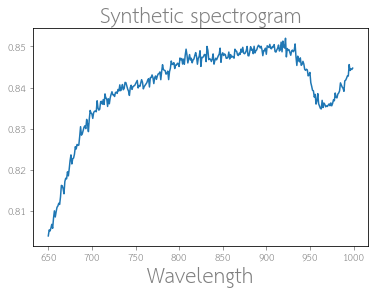

[9.83977774e-02 5.54142257e-05 8.16499384e-03 7.63391658e-03
 9.59267583e-04 7.38400068e-03 4.16198539e-03 3.41472898e-03
 6.29399739e-03]
(350,)
(350,)


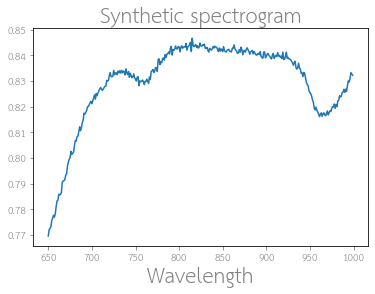

[0.02018114 0.00156986 0.00212383 0.00129853 0.00298889 0.00035559
 0.00963474 0.00255629 0.00510385]
(350,)
(350,)


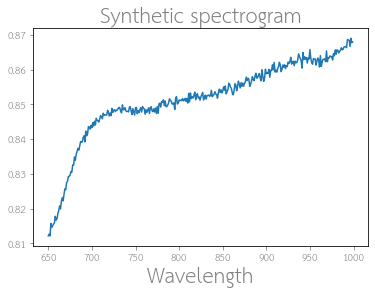

[0.01713169 0.00323451 0.0058559  0.00507546 0.00077495 0.0004059
 0.00049228 0.00366394 0.00970637]
(350,)
(350,)


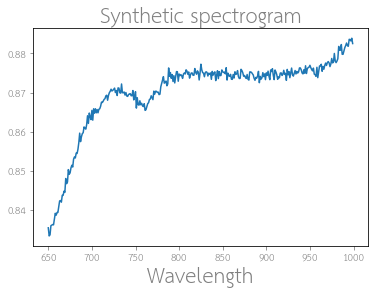

[0.04413316 0.00741658 0.00771405 0.00109254 0.00057974 0.00459973
 0.00282602 0.00189507 0.00912272]
(350,)
(350,)


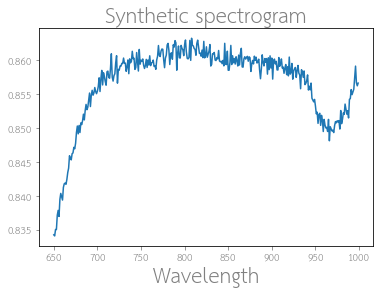

[0.01075681 0.00094727 0.00558217 0.00585821 0.00209789 0.00056249
 0.00338607 0.00619302 0.00463934]
(350,)
(350,)


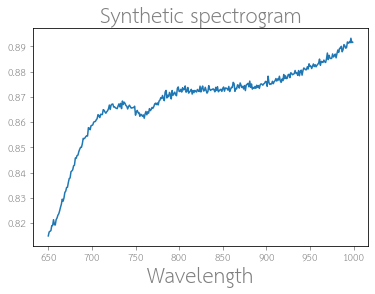

[0.06597001 0.00438766 0.00026838 0.00556099 0.00266062 0.00609112
 0.0066957  0.00617016 0.00787905]
(350,)
(350,)


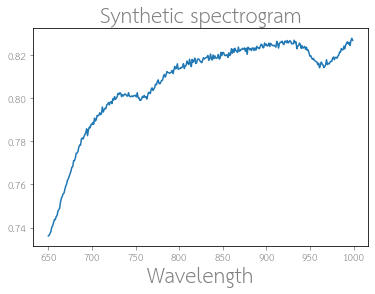

[0.01096865 0.00981532 0.00763172 0.00175445 0.0012119  0.00109969
 0.00625896 0.00796491 0.00342906]
(350,)
(350,)


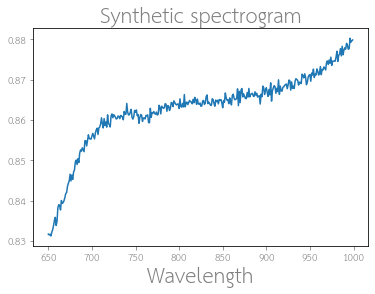

[0.00664838 0.00066571 0.00418278 0.00865824 0.00796697 0.00032269
 0.00441521 0.00319393 0.00518568]
(350,)
(350,)


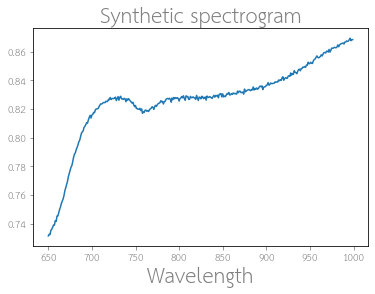

[0.00952983 0.0096638  0.00874879 0.00271887 0.00220757 0.00221678
 0.00873836 0.00843183 0.00059791]
(350,)
(350,)


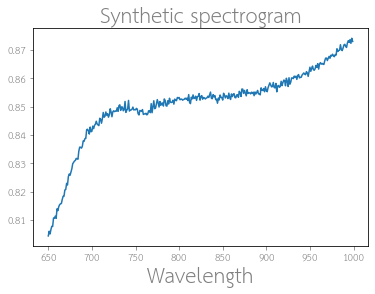

[0.03603153 0.00109647 0.00992152 0.00010253 0.00356758 0.00293874
 0.0055256  0.00550414 0.00618545]
(350,)
(350,)


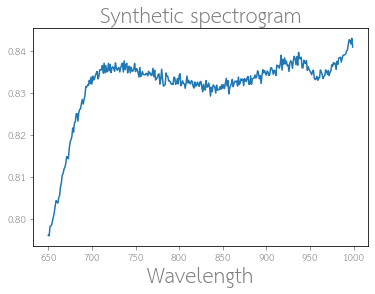

[0.04898959 0.0077226  0.0035994  0.00473872 0.00532012 0.0004482
 0.00875014 0.00838815 0.0099529 ]
(350,)
(350,)


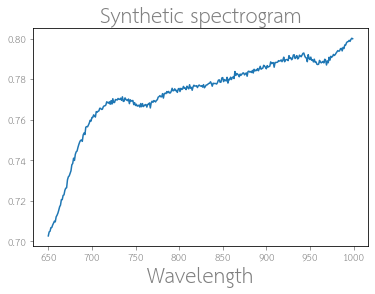

[0.05999007 0.00674716 0.00206188 0.00795549 0.00392789 0.00047536
 0.00490063 0.00411496 0.00593997]
(350,)
(350,)


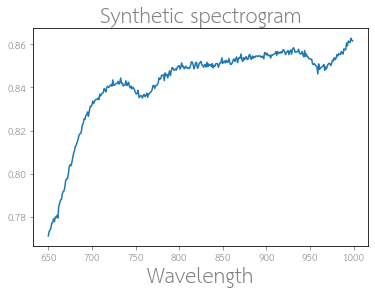

[0.00527749 0.00798773 0.0011362  0.00015929 0.00269151 0.00341954
 0.00200746 0.00762157 0.00319716]
(350,)
(350,)


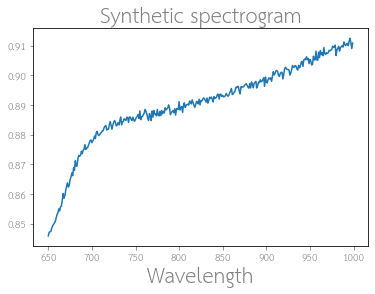

[1.56193224e-02 6.67734668e-03 2.81664740e-03 9.70624343e-03
 7.17238533e-05 9.56875583e-06 4.13293910e-03 5.04768419e-03
 7.52825076e-03]
(350,)
(350,)


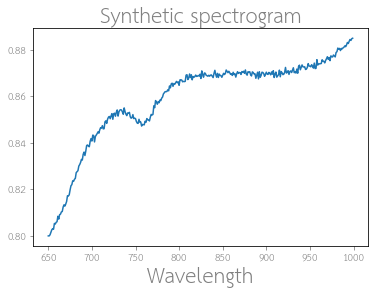

[0.08467419 0.00606073 0.00508074 0.00802395 0.00212271 0.00364412
 0.0022853  0.00692738 0.00010474]
(350,)
(350,)


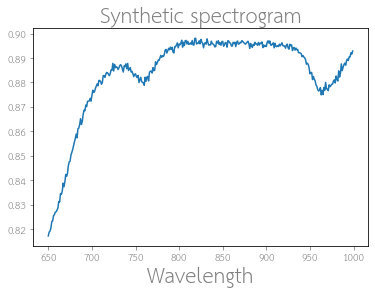

[0.09893081 0.00855969 0.00387683 0.00313594 0.00066674 0.003334
 0.00862128 0.00877353 0.0072657 ]
(350,)
(350,)


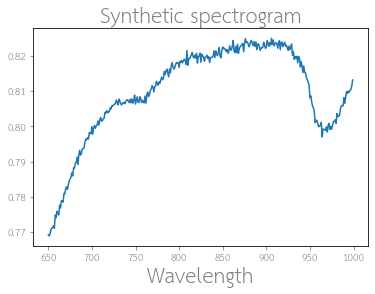

[0.00344924 0.00077598 0.00249006 0.00963766 0.00207311 0.00179513
 0.00824005 0.00809171 0.00645818]
(350,)
(350,)


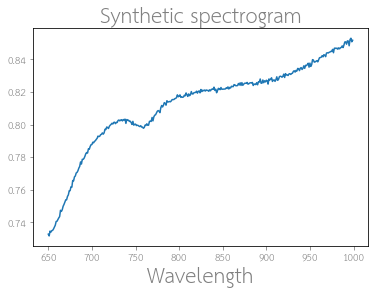

[0.08070722 0.00282535 0.00051117 0.00369243 0.00140968 0.00204943
 0.00117409 0.00482667 0.00615807]
(350,)
(350,)


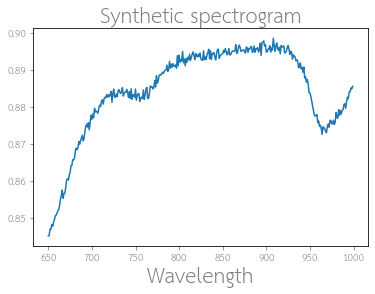

[0.0347649  0.00512797 0.00232857 0.00030073 0.00677001 0.00140795
 0.00546792 0.00810978 0.00260491]
(350,)
(350,)


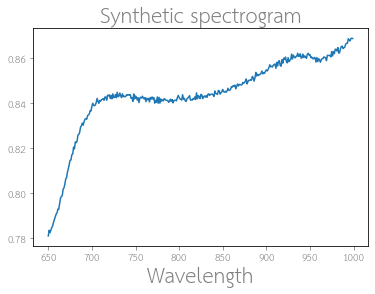

[0.03645939 0.0016228  0.00096622 0.00164047 0.0025253  0.00151704
 0.00841469 0.00309995 0.00813802]
(350,)
(350,)


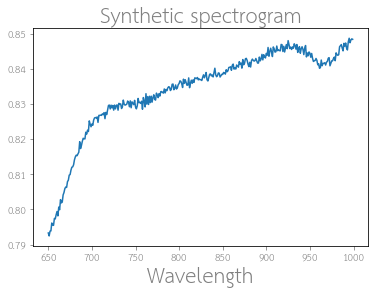

[0.06846337 0.00630253 0.00866901 0.00895955 0.00013388 0.00044648
 0.00770148 0.00921586 0.00610426]
(350,)
(350,)


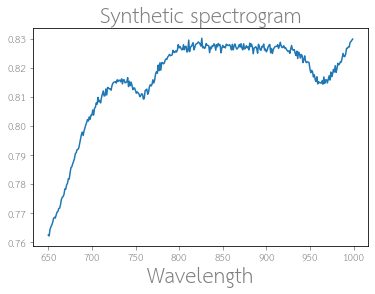

[0.09242521 0.00218795 0.00227618 0.00667543 0.00224957 0.00062903
 0.00338115 0.00541751 0.00634984]
(350,)
(350,)


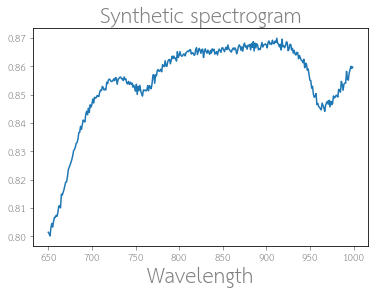

[0.01073492 0.00534984 0.00042555 0.00313959 0.00849377 0.00124368
 0.00042281 0.00023237 0.00382649]
(350,)
(350,)


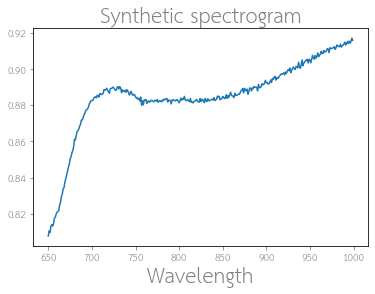

[0.06629594 0.00021082 0.00796578 0.00945311 0.00800861 0.0003299
 0.00438499 0.00081117 0.0055704 ]
(350,)
(350,)


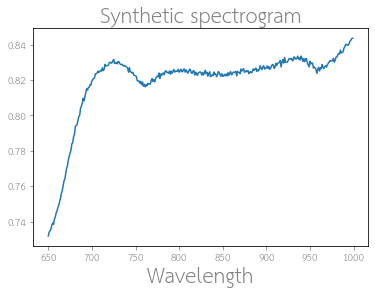

[8.48651282e-02 2.27196036e-03 7.51758271e-04 1.92887947e-03
 3.06331887e-05 3.91384006e-06 8.54941935e-03 4.71606359e-03
 4.50750472e-03]
(350,)
(350,)


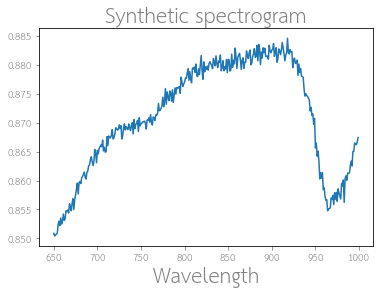

[0.0883404  0.00427964 0.00138753 0.00200975 0.00141336 0.00545877
 0.00846271 0.00056817 0.00166487]
(350,)
(350,)


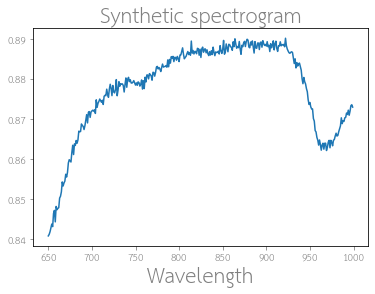

[0.04011294 0.00486079 0.00708072 0.0021116  0.00581841 0.00226714
 0.00955361 0.00909658 0.00370927]
(350,)
(350,)


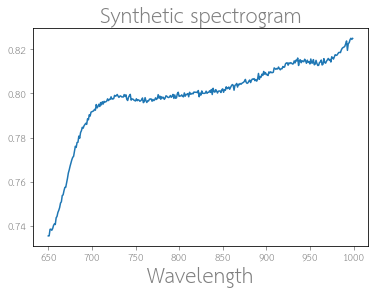

[3.09517931e-02 8.93938296e-03 2.50889663e-03 5.27960862e-03
 4.74075286e-03 3.17209009e-04 7.09078460e-05 8.92055480e-03
 1.69029936e-03]
(350,)
(350,)


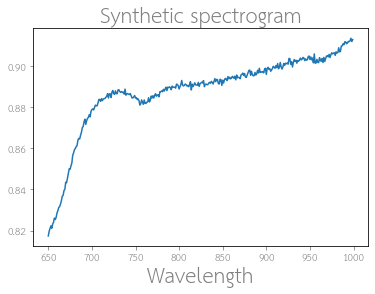

[0.07740824 0.00567069 0.0001373  0.00607219 0.00457065 0.00151129
 0.00300469 0.00422457 0.00587819]
(350,)
(350,)


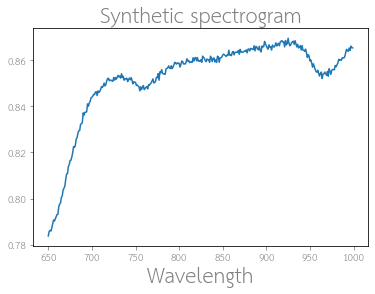

[0.0205587  0.00629997 0.00382368 0.00576351 0.0016386  0.00482672
 0.00240654 0.00017674 0.00330409]
(350,)
(350,)


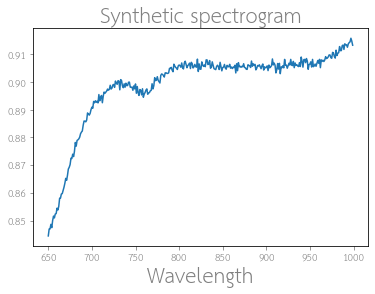

[0.04862893 0.00163512 0.00678708 0.00657815 0.00500089 0.00187345
 0.00464627 0.00630863 0.00241339]
(350,)
(350,)


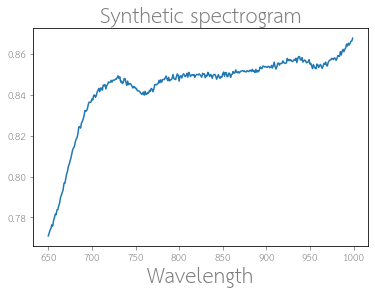

[0.02142176 0.00791253 0.00355888 0.00030899 0.0012008  0.00081071
 0.00062012 0.00778651 0.00129377]
(350,)
(350,)


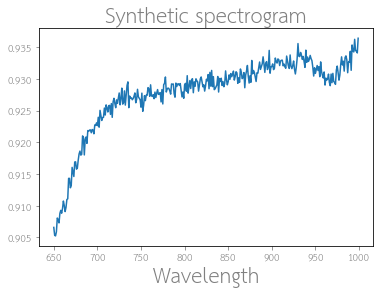

[0.06807029 0.00760838 0.00396235 0.00989586 0.00053864 0.00377669
 0.00814197 0.0099315  0.0092857 ]
(350,)
(350,)


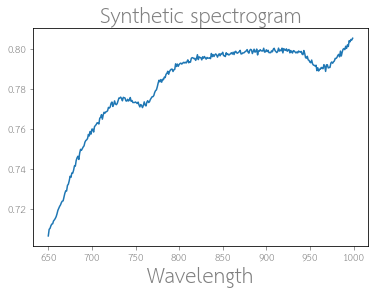

[0.07144987 0.00515473 0.00205033 0.00436461 0.00116786 0.0017088
 0.00738333 0.00636458 0.00842383]
(350,)
(350,)


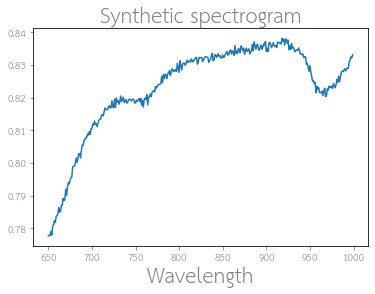

[0.05356704 0.0080816  0.00648414 0.00752719 0.00067044 0.00101785
 0.00714824 0.00348112 0.00282427]
(350,)
(350,)


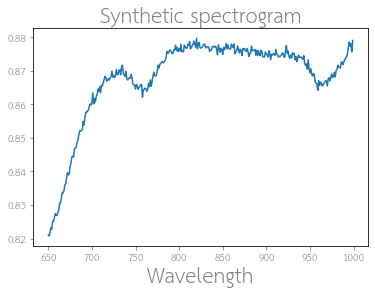

[0.04097356 0.00697416 0.00031171 0.00753401 0.00580622 0.00080213
 0.00951513 0.00575559 0.00110416]
(350,)
(350,)


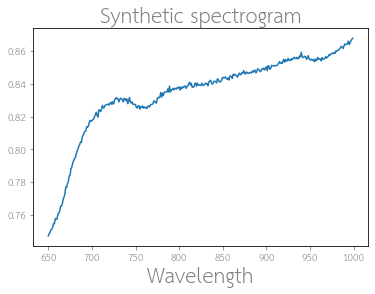

[0.06140689 0.00739509 0.00376899 0.00451261 0.00319207 0.00430201
 0.00519469 0.00107881 0.00998981]
(350,)
(350,)


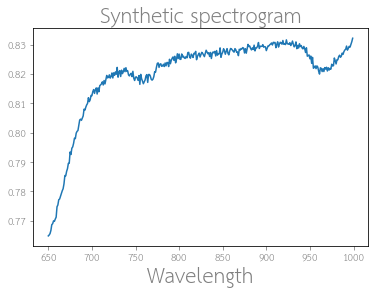

[0.08160012 0.00195059 0.00205504 0.00607276 0.00317973 0.00199476
 0.00192153 0.00430033 0.0076015 ]
(350,)
(350,)


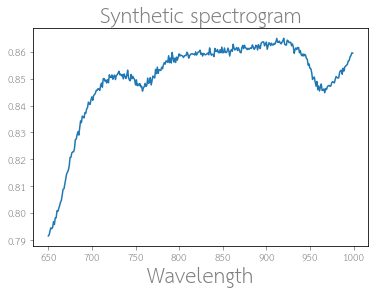

[1.08586380e-02 4.46294596e-04 3.37374225e-05 7.39286706e-03
 9.11380051e-04 6.19517987e-05 6.15101892e-03 9.58951656e-04
 1.35343267e-03]
(350,)
(350,)


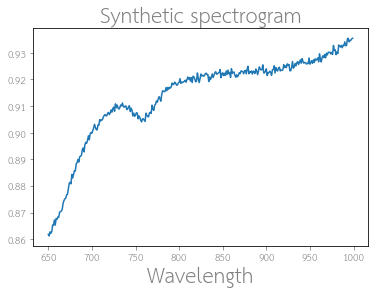

[0.0987745  0.00255781 0.00976984 0.00756792 0.00346342 0.00640166
 0.00384891 0.00153319 0.00800934]
(350,)
(350,)


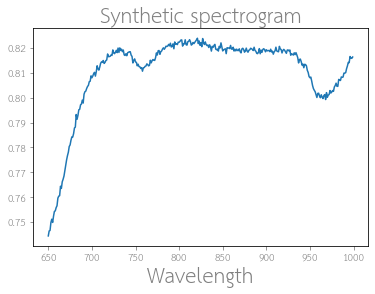

[0.01946116 0.00369018 0.0074785  0.00681976 0.0003613  0.00168193
 0.00631899 0.00274338 0.00144031]
(350,)
(350,)


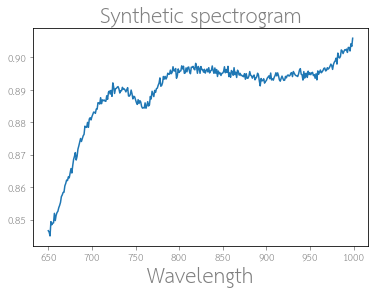

[0.04878781 0.00369097 0.00199856 0.0053203  0.00337673 0.00528109
 0.0075271  0.0081442  0.00302554]
(350,)
(350,)


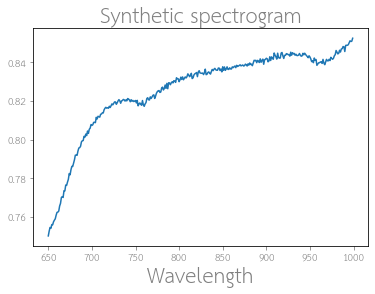

[0.02629622 0.00849825 0.00499341 0.00377128 0.00045917 0.00027191
 0.00639239 0.00319364 0.00742862]
(350,)
(350,)


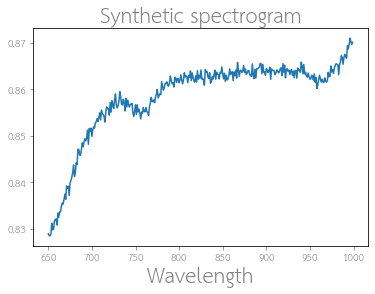

[0.08998369 0.00168975 0.00019712 0.00442095 0.00448333 0.0021448
 0.0079491  0.0047026  0.00832302]
(350,)
(350,)


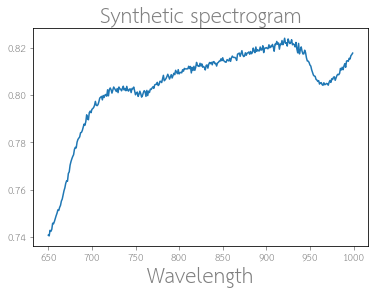

[8.26629833e-02 8.80317141e-03 5.71234032e-03 1.38379476e-03
 3.24471627e-04 6.54869316e-05 1.88248185e-03 3.09026975e-03
 1.75579545e-03]
(350,)
(350,)


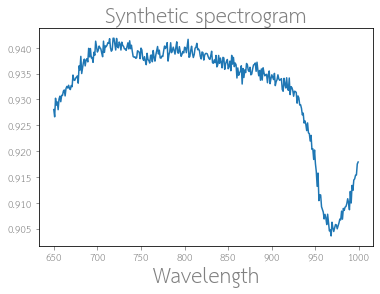

[0.05637162 0.00113791 0.00255176 0.00816067 0.00271251 0.00319575
 0.00756674 0.00063829 0.00856199]
(350,)
(350,)


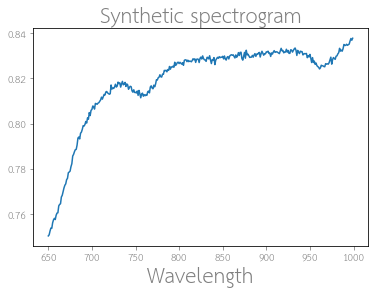

[2.55114030e-02 2.11500265e-04 4.12406595e-03 6.82897735e-03
 3.55650098e-03 3.04251627e-03 7.98544176e-05 6.57506695e-03
 6.04584278e-03]
(350,)
(350,)


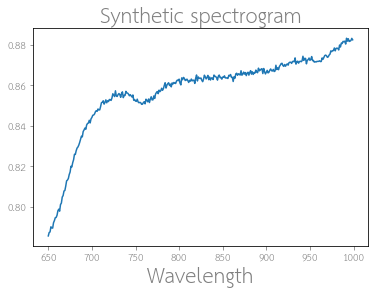

[0.00060359 0.00619019 0.00879409 0.00497797 0.0044807  0.00389239
 0.00469386 0.00565656 0.00913297]
(350,)
(350,)


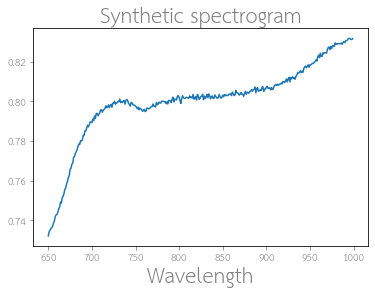

[5.55134439e-02 4.45544888e-03 4.29080399e-03 7.86956915e-03
 1.39532815e-05 8.60208148e-04 2.60110848e-03 6.00924071e-03
 8.89811956e-03]
(350,)
(350,)


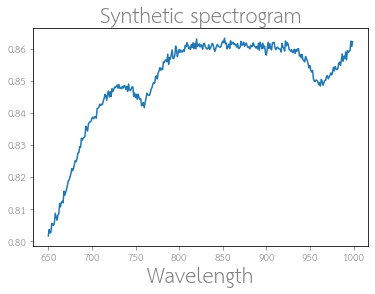

[9.84666265e-02 1.29653820e-03 8.91702181e-05 4.82397401e-03
 2.02335935e-04 8.30919643e-04 1.97848239e-06 8.05448839e-03
 1.01969563e-03]
(350,)
(350,)


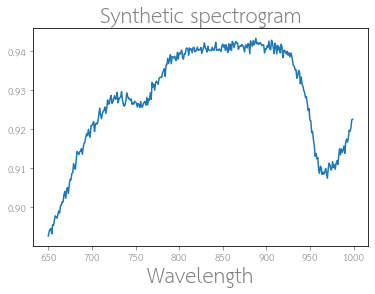

[0.09900827 0.0020605  0.00847004 0.00878382 0.00480382 0.00426414
 0.00943612 0.00486933 0.00928784]
(350,)
(350,)


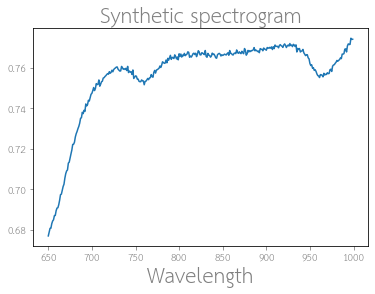

[0.07805558 0.00080915 0.00391811 0.00612919 0.00132721 0.00079888
 0.00305315 0.00628646 0.00039214]
(350,)
(350,)


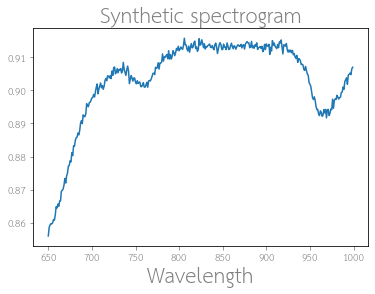

[0.08134598 0.00374114 0.0069032  0.00736032 0.00074861 0.00709566
 0.00046409 0.00298707 0.00314532]
(350,)
(350,)


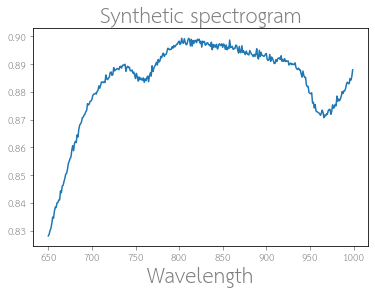

[0.06663024 0.00860087 0.00823529 0.00342394 0.00444151 0.00123778
 0.0034215  0.00518129 0.00559288]
(350,)
(350,)


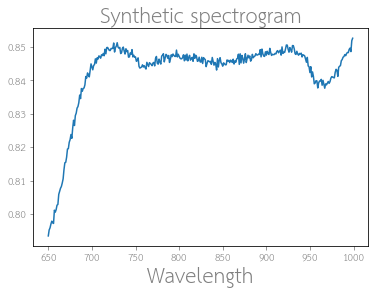

[0.08782025 0.00945944 0.0063232  0.00967417 0.00262261 0.00429035
 0.00129235 0.00958754 0.00266687]
(350,)
(350,)


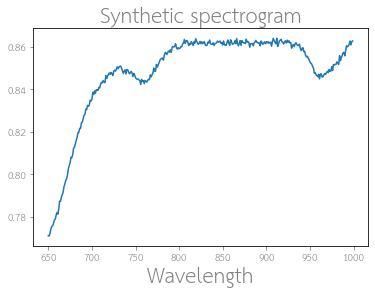

[0.08846735 0.00289318 0.00347858 0.00238243 0.00182661 0.0033055
 0.00195692 0.00726561 0.00856034]
(350,)
(350,)


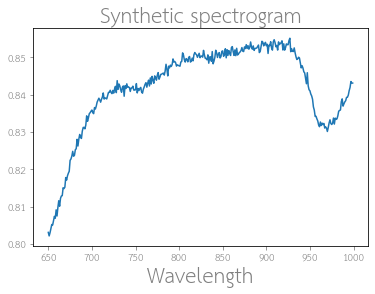

[0.00870686 0.00855983 0.00532426 0.00385428 0.00738996 0.00128785
 0.00101729 0.00781059 0.00193182]
(350,)
(350,)


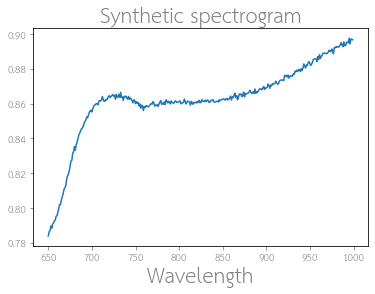

[0.09277775 0.00948787 0.00509165 0.00110989 0.00011373 0.00042875
 0.00443713 0.00259027 0.00923221]
(350,)
(350,)


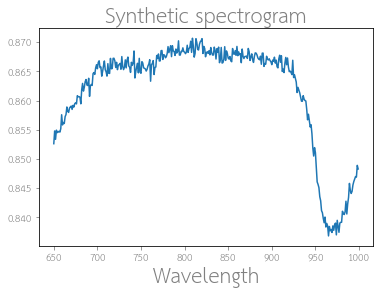

[1.60966538e-02 8.67154802e-03 8.23904251e-03 8.25983214e-03
 3.27898352e-05 7.14534954e-05 5.21951819e-03 3.76641277e-03
 2.13425500e-03]
(350,)
(350,)


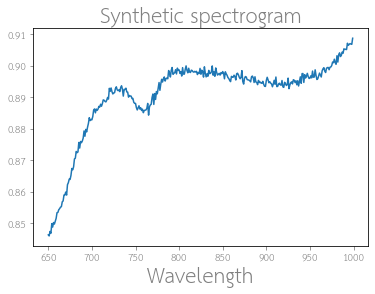

[0.0176975  0.001393   0.00892741 0.00400848 0.00148503 0.00331092
 0.00681703 0.00582633 0.00157473]
(350,)
(350,)


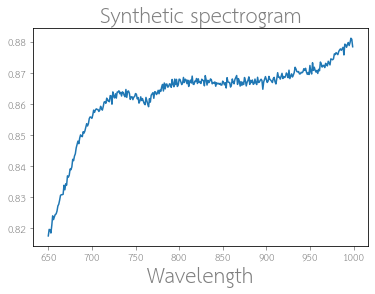

[0.06955706 0.00841    0.00475115 0.00468213 0.00089106 0.00485126
 0.00830378 0.00971469 0.00828944]
(350,)
(350,)


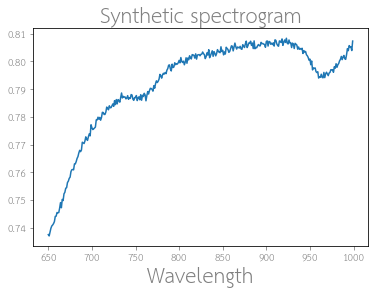

[3.90288629e-02 7.40436232e-03 1.27257979e-04 3.78468809e-03
 4.63935520e-05 7.22690714e-04 3.39184175e-03 9.43782009e-03
 3.00159983e-03]
(350,)
(350,)


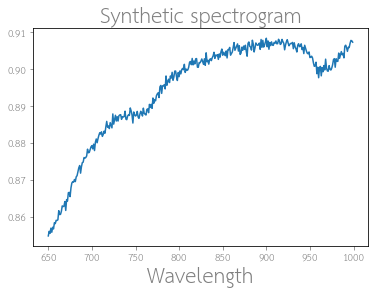

[0.02895899 0.00145666 0.00634406 0.00118693 0.00273495 0.00588849
 0.00714261 0.00373768 0.00766708]
(350,)
(350,)


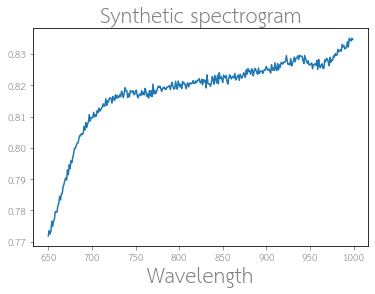

[0.05411207 0.00342352 0.00490441 0.00565093 0.00193649 0.00018673
 0.00982591 0.00465181 0.00416925]
(350,)
(350,)


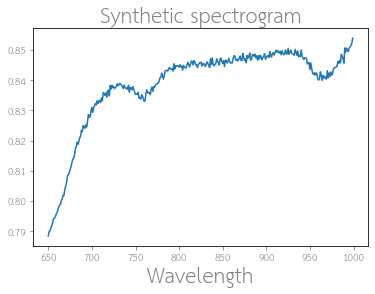

[0.06354737 0.0045309  0.00136319 0.00245824 0.00050561 0.00030972
 0.00205289 0.00786037 0.00661716]
(350,)
(350,)


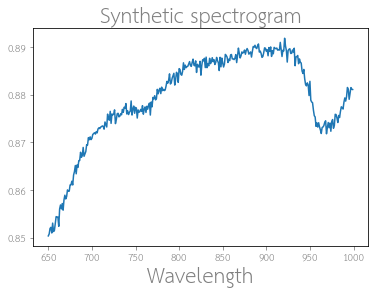

[8.79105475e-02 1.51724466e-04 2.93860326e-04 3.10081318e-03
 4.36703635e-03 2.91666185e-03 6.03650439e-05 2.42955709e-03
 8.55601777e-03]
(350,)
(350,)


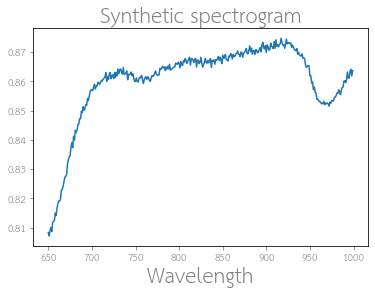

[5.38672506e-02 3.23050170e-03 9.87500868e-03 3.75341252e-05
 6.66093445e-03 3.90026775e-04 7.57747238e-03 6.64722815e-03
 3.77180694e-05]
(350,)
(350,)


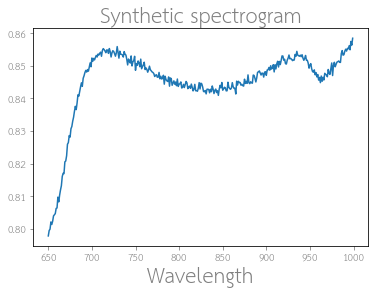

[0.05039861 0.00274443 0.00960477 0.00126597 0.00327444 0.0027171
 0.00789929 0.00333163 0.00336951]
(350,)
(350,)


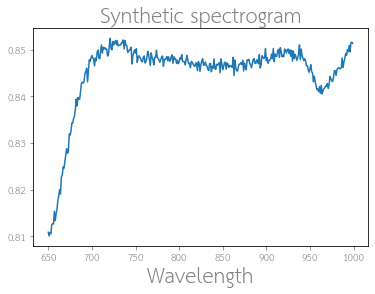

[0.06003778 0.00825456 0.00520042 0.0042758  0.00154895 0.00333733
 0.00512995 0.00574512 0.00370678]
(350,)
(350,)


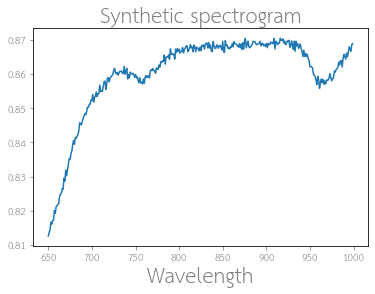

[0.07483924 0.00051424 0.00034714 0.00585167 0.00432632 0.00138186
 0.00328906 0.00480519 0.00993304]
(350,)
(350,)


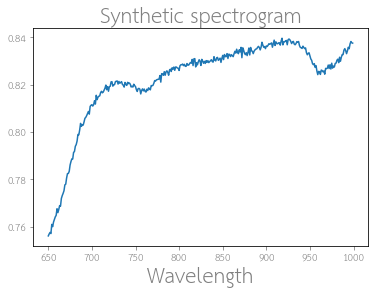

In [44]:
import os
x_loaded = np.load(path_s + 'x.npz')

for file in os.listdir(path_s + 'y_and_params/'):
    y_loaded = np.load(path_s + 'y_and_params/' + file)
    #print(np.max(y_loaded['spectra']),np.max(y_loaded['spectra']))
    print(y_loaded['params'])
    print(x_loaded['x'].shape)
    print(y_loaded['spectra'].shape)
    plt.plot(x_loaded['x'], y_loaded['spectra'])
    plt.xlabel("Wavelength", fontsize=20)
    plt.title("Synthetic spectrogram", fontsize=20)
    plt.show()
    

In [41]:
# let's do the same with just 3 spectras to see how ill-posed it is for smaller number of spectras

def func_array(x, a_w, a_f, a_hbo2, a_hbb, a_cox, a_cred, s_blood, s_wm, s_gm):
    y = []
    
    for xx in x:
        #print(xx)
        xx = int(xx) - left_cut
        #print(xx)
        m_a = a_w*np.asarray(y_water[xx]) + a_hbo2*np.asarray(y_hbb[xx]) + a_cox*np.asarray(y_cox[xx]) 
        
        exp_m = np.exp(- m_a)
        
        sp = exp_m**2 #signal power
        snr = 1e6 #signal to noise ratio
        std_n = ( sp / snr )**0.5 #noise std. deviation
                
        y.append(exp_m + np.random.normal(0, std_n, 1)[0])

        
    return y # I = I_o * exp(-(m_a+m_s)x)  

number_of_samples = int(100)

### sample randomly coefficients of the composition:

# absorption
a_w = np.random.uniform(0,0.1,number_of_samples)
a_f = np.random.uniform(0,0.01,number_of_samples)
a_hbo2 = np.random.uniform(0,0.01,number_of_samples)
a_hbb = np.random.uniform(0,0.01,number_of_samples)
a_ctotal = np.random.uniform(0,0.01,number_of_samples) # cred is dependent as cox + cred stay the same
a_cred = []
for item in a_ctotal: # cred is dependent as cox + cred stay the same
    a_cred.append(np.random.uniform(0,item,1)[0])
a_cred = np.asarray(a_cred)

# scattering
s_blood = np.random.uniform(0,0.01,number_of_samples)
s_wm = np.random.uniform(0,0.01,number_of_samples)
s_gm = np.random.uniform(0,0.01,number_of_samples)

# Now we create the dataset by plugging the sampled coefficients
path_s = "/home/ivan/aimlab/HELICoiD/synthetic_data/" # path where we store the dataset
for i in range(len(a_w)): 
    synth_spect_dataset = func_array(x, a_w[i], a_f[i], a_hbo2[i], a_hbb[i], a_ctotal[i]-a_cred[i], a_cred[i], s_blood[i], s_wm[i], s_gm[i]) 
    synth_spect_params = [a_w[i], a_f[i], a_hbo2[i], a_hbb[i], a_ctotal[i]-a_cred[i], a_cred[i], s_blood[i], s_wm[i], s_gm[i]]
    np.savez_compressed(path_s + "y_and_params/" + str(i), spectra=synth_spect_dataset, params=synth_spect_params)
np.savez_compressed(path_s + "x", x=x)


[0.03898144 0.00309701 0.00936714 0.00044727 0.00229919 0.00269649
 0.0007274  0.00724841 0.00142686]
(350,)
(350,)


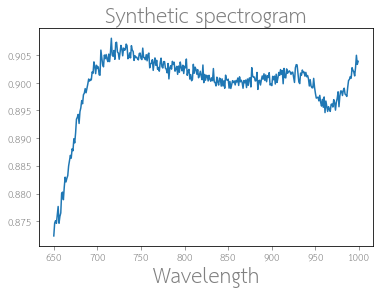

[0.02824589 0.00496489 0.00393227 0.00532135 0.00017001 0.00762805
 0.00438286 0.0041834  0.00932427]
(350,)
(350,)


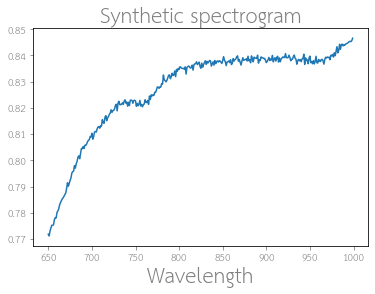

[0.04050289 0.00286636 0.00402731 0.00620556 0.00177201 0.00042732
 0.00710729 0.00376244 0.00337171]
(350,)
(350,)


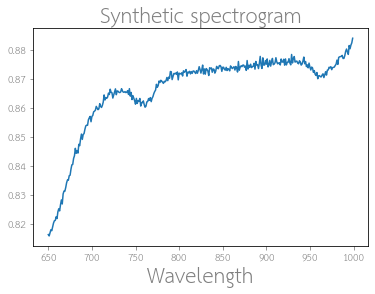

[0.09587665 0.00916742 0.00479545 0.0075418  0.00215707 0.00041889
 0.00393788 0.00394262 0.00078829]
(350,)
(350,)


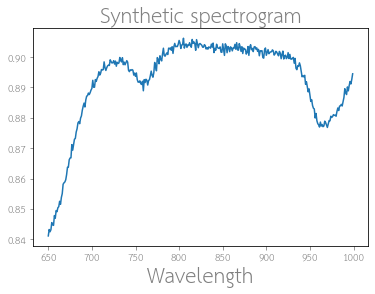

[0.0514307  0.00858169 0.00980415 0.00207824 0.00313297 0.00683905
 0.00161286 0.00981059 0.00104185]
(350,)
(350,)


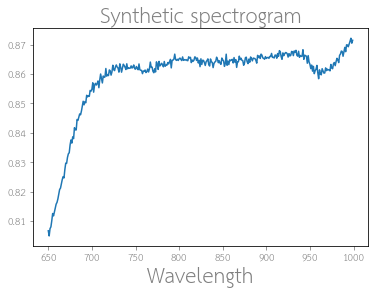

[0.08948331 0.00267301 0.00865855 0.00314974 0.00070593 0.00633141
 0.00375371 0.00149977 0.0081043 ]
(350,)
(350,)


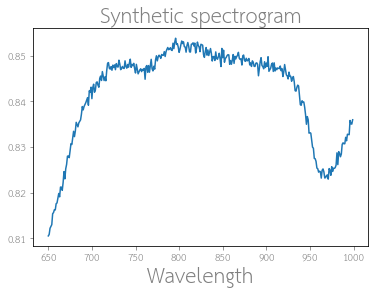

[0.03482577 0.00024123 0.00186422 0.00708647 0.0002819  0.00086439
 0.00702231 0.00751476 0.00544551]
(350,)
(350,)


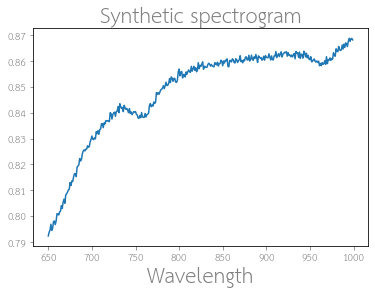

[0.07256314 0.00339245 0.00378471 0.0081378  0.00229585 0.00430927
 0.00877372 0.00377471 0.00127156]
(350,)
(350,)


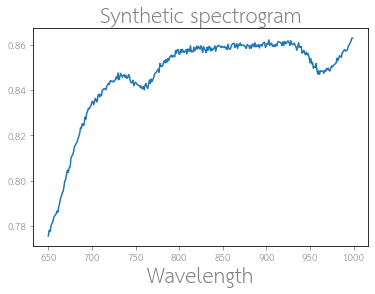

[0.02421947 0.00708327 0.00415664 0.00071553 0.00081844 0.00471341
 0.00483892 0.00262706 0.00317082]
(350,)
(350,)


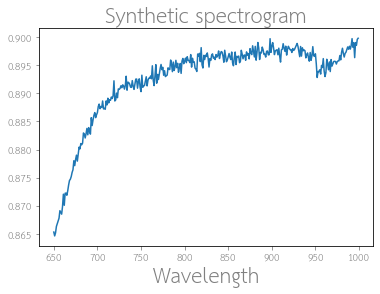

[0.09959872 0.00631796 0.00155325 0.0032743  0.00033001 0.00032805
 0.00979352 0.00119605 0.00092427]
(350,)
(350,)


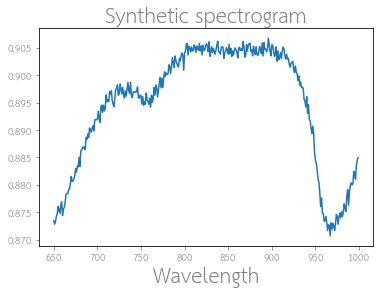

[0.05480946 0.00190176 0.00632201 0.00899088 0.00041465 0.00299619
 0.00584021 0.00192898 0.00399735]
(350,)
(350,)


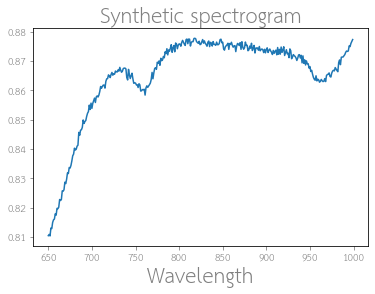

[0.07572505 0.00169715 0.00204077 0.00833093 0.00056923 0.00510757
 0.00471557 0.00504552 0.00858819]
(350,)
(350,)


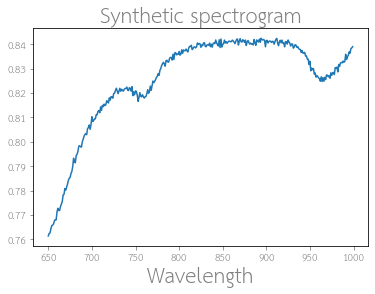

[0.05551287 0.00431728 0.00829507 0.00889906 0.00024389 0.00093684
 0.00851865 0.00753801 0.00533149]
(350,)
(350,)


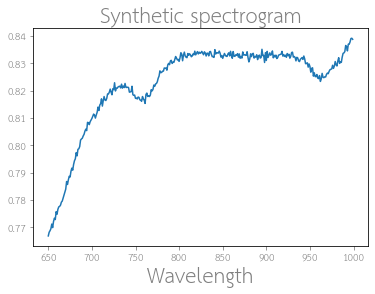

[0.0931592  0.00877682 0.00996061 0.00204576 0.00038158 0.00674969
 0.00864221 0.00064973 0.00340649]
(350,)
(350,)


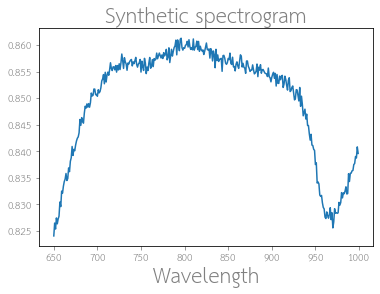

[0.00765783 0.00757448 0.00745269 0.00857298 0.00367262 0.00384911
 0.00422124 0.00363463 0.00907319]
(350,)
(350,)


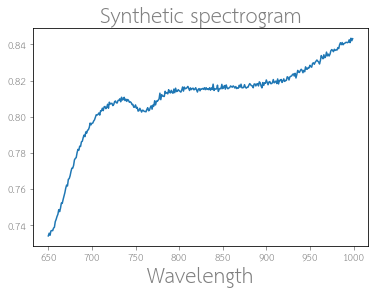

[3.98333344e-02 9.08168520e-03 4.04616377e-03 7.79634856e-03
 1.16160084e-03 4.86160810e-03 7.92605687e-03 8.97087270e-03
 5.84813787e-05]
(350,)
(350,)


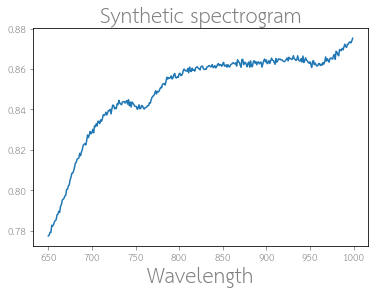

[7.51451399e-02 6.30839174e-04 4.46099788e-04 8.02459083e-04
 3.15763222e-03 5.60903861e-05 3.36212469e-03 5.69487311e-04
 6.27698245e-03]
(350,)
(350,)


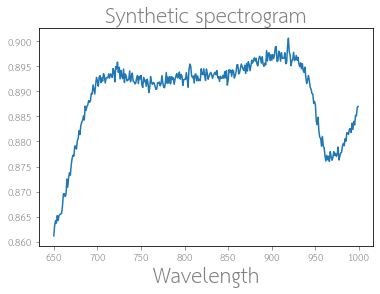

[0.00345531 0.00779443 0.00420624 0.00962461 0.00227371 0.00311625
 0.00899257 0.0040395  0.00910053]
(350,)
(350,)


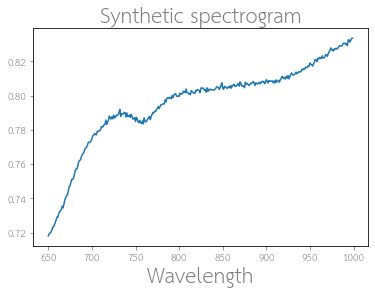

[0.0285467  0.00186892 0.00843484 0.0041694  0.00471792 0.00217715
 0.0068452  0.00168583 0.00565279]
(350,)
(350,)


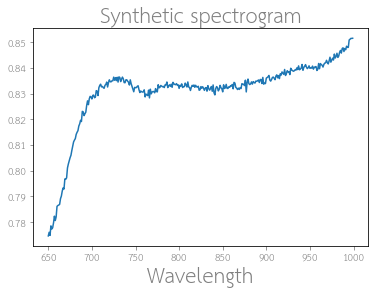

[0.03288357 0.00054414 0.00929464 0.00759497 0.00109494 0.00465157
 0.00813126 0.00235577 0.003639  ]
(350,)
(350,)


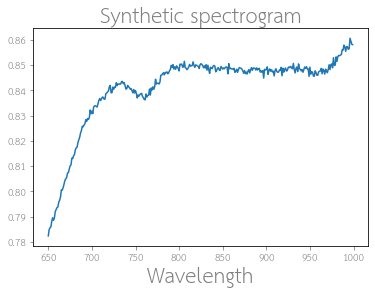

[0.00549948 0.00269393 0.00037555 0.00521194 0.00113141 0.00082075
 0.00281913 0.00568271 0.00726283]
(350,)
(350,)


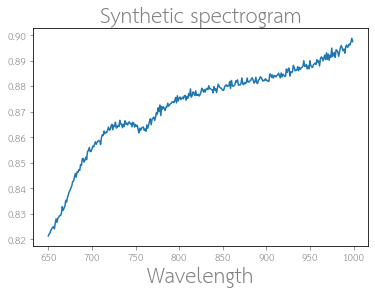

[0.02321198 0.00402099 0.00172401 0.00426623 0.00261096 0.00317202
 0.00726196 0.00283306 0.00304391]
(350,)
(350,)


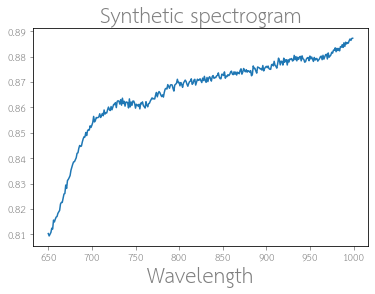

[0.08693776 0.0084052  0.00675082 0.00462663 0.00021701 0.00055035
 0.00995385 0.00593093 0.00325234]
(350,)
(350,)


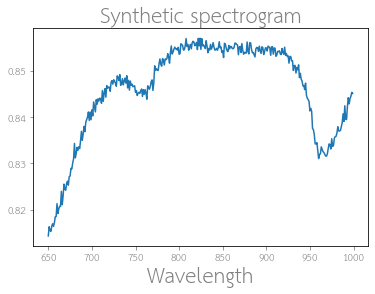

[0.01684436 0.00334376 0.00771279 0.0021     0.00341289 0.00044846
 0.00381618 0.00507765 0.00654811]
(350,)
(350,)


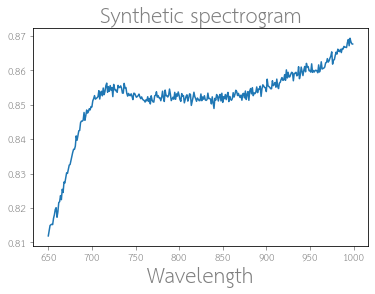

[0.07032838 0.00751421 0.00169478 0.00911615 0.00027245 0.00045076
 0.00292597 0.00308817 0.00580536]
(350,)
(350,)


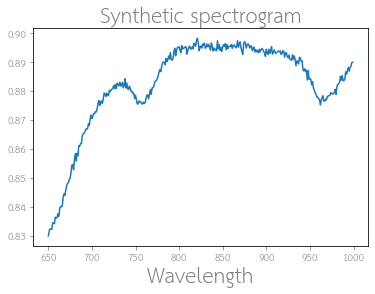

[0.09388707 0.0050343  0.00587275 0.00346281 0.00406215 0.00040587
 0.00419629 0.00183109 0.00980878]
(350,)
(350,)


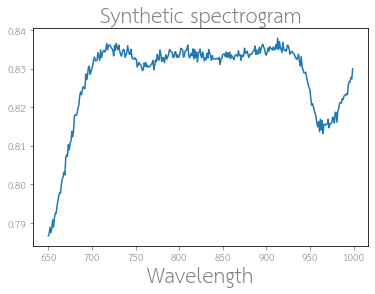

[0.09741602 0.00185889 0.00541577 0.00658924 0.0001954  0.00276894
 0.00394827 0.00479186 0.002714  ]
(350,)
(350,)


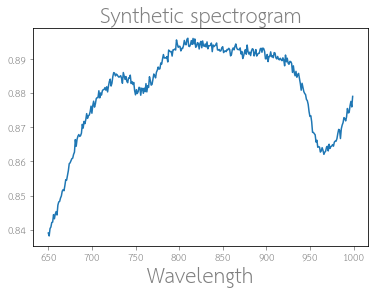

[0.07979426 0.00056332 0.00493554 0.00845954 0.00208536 0.00045103
 0.00328329 0.00852821 0.002191  ]
(350,)
(350,)


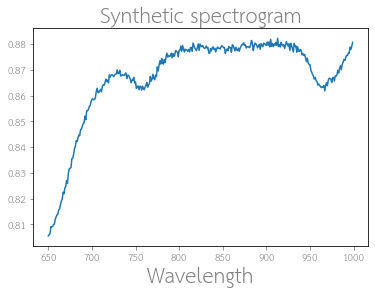

[0.08881995 0.00753121 0.00661633 0.00054062 0.00315128 0.00508947
 0.00672196 0.00749254 0.00790953]
(350,)
(350,)


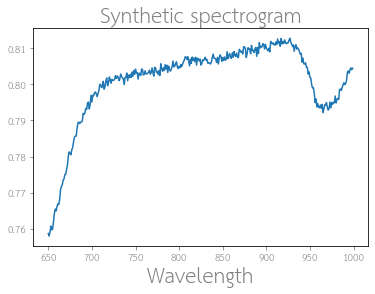

[0.06532069 0.00894274 0.00553555 0.00131687 0.00132057 0.00441167
 0.00180245 0.00885347 0.00808468]
(350,)
(350,)


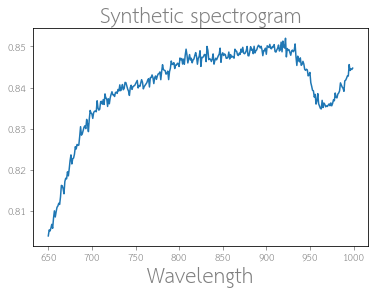

[9.83977774e-02 5.54142257e-05 8.16499384e-03 7.63391658e-03
 9.59267583e-04 7.38400068e-03 4.16198539e-03 3.41472898e-03
 6.29399739e-03]
(350,)
(350,)


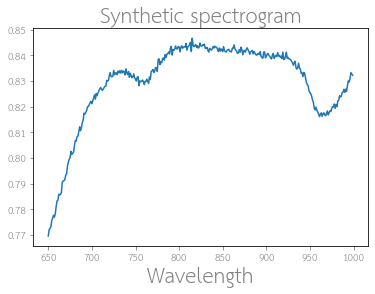

[0.02018114 0.00156986 0.00212383 0.00129853 0.00298889 0.00035559
 0.00963474 0.00255629 0.00510385]
(350,)
(350,)


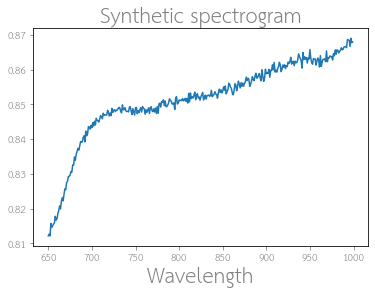

[0.01713169 0.00323451 0.0058559  0.00507546 0.00077495 0.0004059
 0.00049228 0.00366394 0.00970637]
(350,)
(350,)


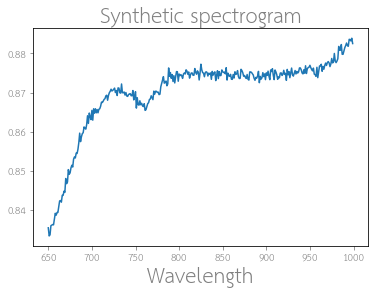

[0.04413316 0.00741658 0.00771405 0.00109254 0.00057974 0.00459973
 0.00282602 0.00189507 0.00912272]
(350,)
(350,)


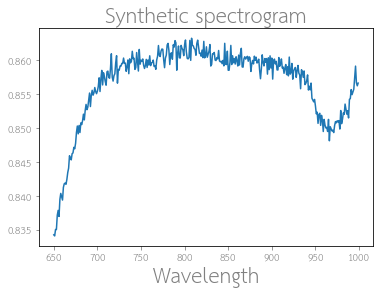

[0.01075681 0.00094727 0.00558217 0.00585821 0.00209789 0.00056249
 0.00338607 0.00619302 0.00463934]
(350,)
(350,)


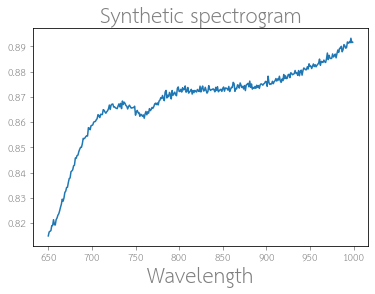

[0.06597001 0.00438766 0.00026838 0.00556099 0.00266062 0.00609112
 0.0066957  0.00617016 0.00787905]
(350,)
(350,)


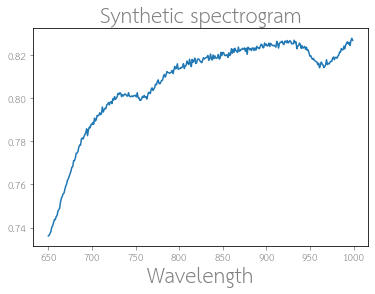

[0.01096865 0.00981532 0.00763172 0.00175445 0.0012119  0.00109969
 0.00625896 0.00796491 0.00342906]
(350,)
(350,)


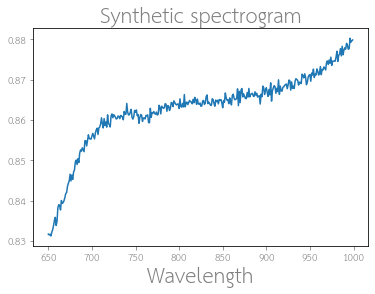

[0.00664838 0.00066571 0.00418278 0.00865824 0.00796697 0.00032269
 0.00441521 0.00319393 0.00518568]
(350,)
(350,)


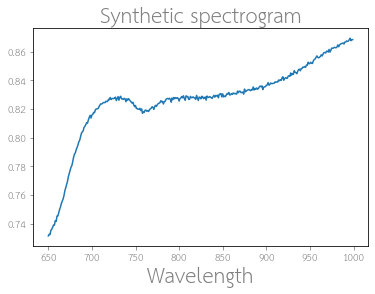

[0.00952983 0.0096638  0.00874879 0.00271887 0.00220757 0.00221678
 0.00873836 0.00843183 0.00059791]
(350,)
(350,)


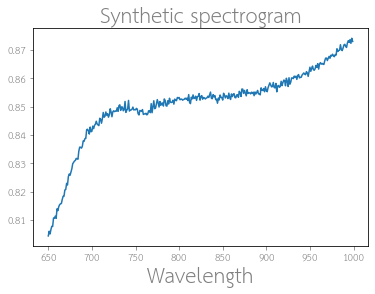

[0.03603153 0.00109647 0.00992152 0.00010253 0.00356758 0.00293874
 0.0055256  0.00550414 0.00618545]
(350,)
(350,)


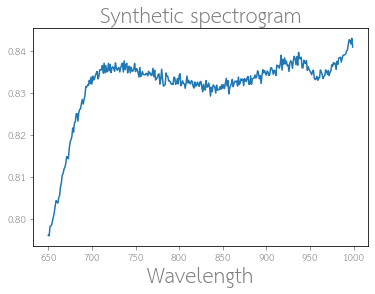

[0.04898959 0.0077226  0.0035994  0.00473872 0.00532012 0.0004482
 0.00875014 0.00838815 0.0099529 ]
(350,)
(350,)


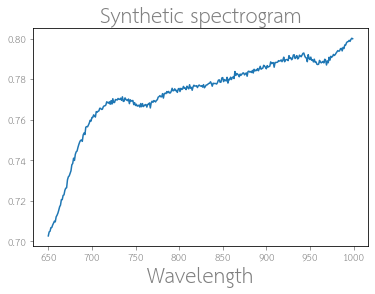

[0.05999007 0.00674716 0.00206188 0.00795549 0.00392789 0.00047536
 0.00490063 0.00411496 0.00593997]
(350,)
(350,)


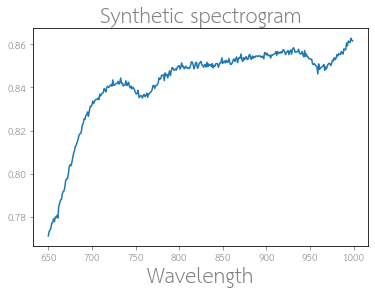

[0.00527749 0.00798773 0.0011362  0.00015929 0.00269151 0.00341954
 0.00200746 0.00762157 0.00319716]
(350,)
(350,)


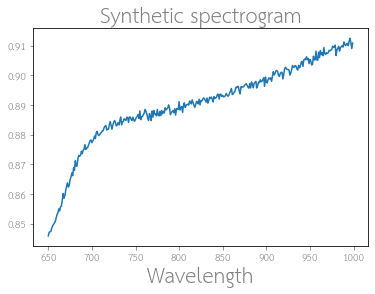

[1.56193224e-02 6.67734668e-03 2.81664740e-03 9.70624343e-03
 7.17238533e-05 9.56875583e-06 4.13293910e-03 5.04768419e-03
 7.52825076e-03]
(350,)
(350,)


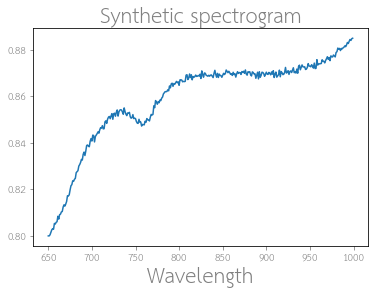

[0.08467419 0.00606073 0.00508074 0.00802395 0.00212271 0.00364412
 0.0022853  0.00692738 0.00010474]
(350,)
(350,)


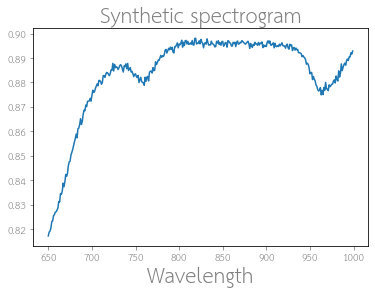

[0.09893081 0.00855969 0.00387683 0.00313594 0.00066674 0.003334
 0.00862128 0.00877353 0.0072657 ]
(350,)
(350,)


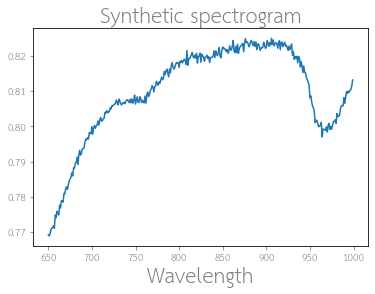

[0.00344924 0.00077598 0.00249006 0.00963766 0.00207311 0.00179513
 0.00824005 0.00809171 0.00645818]
(350,)
(350,)


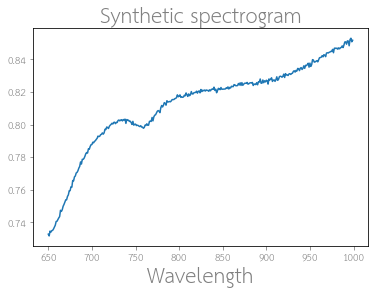

[0.08070722 0.00282535 0.00051117 0.00369243 0.00140968 0.00204943
 0.00117409 0.00482667 0.00615807]
(350,)
(350,)


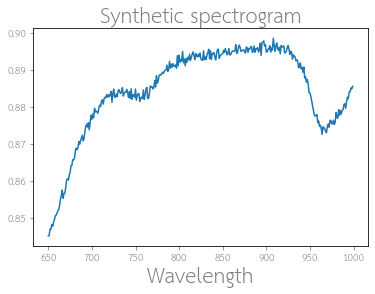

[0.0347649  0.00512797 0.00232857 0.00030073 0.00677001 0.00140795
 0.00546792 0.00810978 0.00260491]
(350,)
(350,)


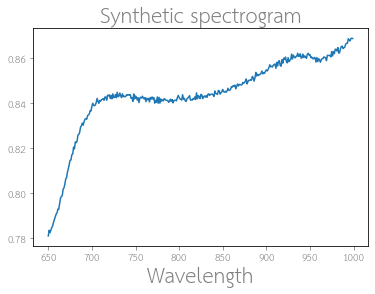

[0.03645939 0.0016228  0.00096622 0.00164047 0.0025253  0.00151704
 0.00841469 0.00309995 0.00813802]
(350,)
(350,)


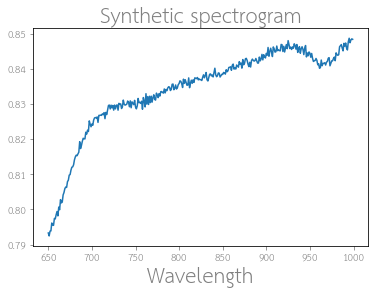

[0.06846337 0.00630253 0.00866901 0.00895955 0.00013388 0.00044648
 0.00770148 0.00921586 0.00610426]
(350,)
(350,)


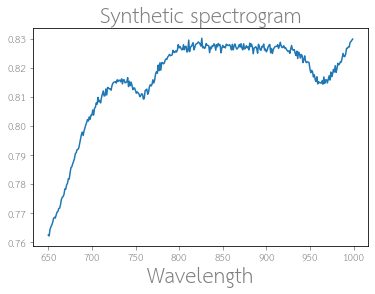

[0.09242521 0.00218795 0.00227618 0.00667543 0.00224957 0.00062903
 0.00338115 0.00541751 0.00634984]
(350,)
(350,)


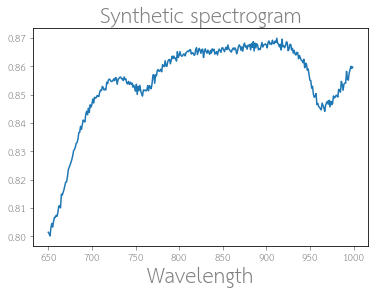

[0.01073492 0.00534984 0.00042555 0.00313959 0.00849377 0.00124368
 0.00042281 0.00023237 0.00382649]
(350,)
(350,)


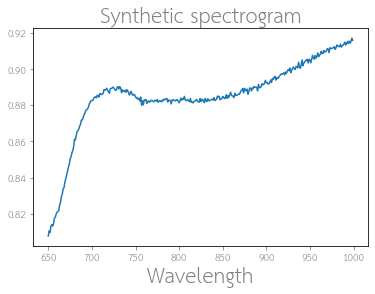

[0.06629594 0.00021082 0.00796578 0.00945311 0.00800861 0.0003299
 0.00438499 0.00081117 0.0055704 ]
(350,)
(350,)


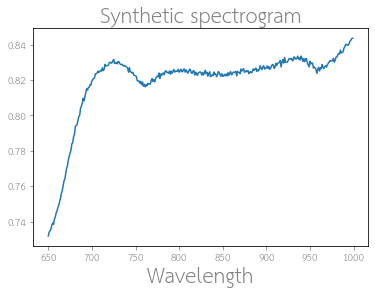

[8.48651282e-02 2.27196036e-03 7.51758271e-04 1.92887947e-03
 3.06331887e-05 3.91384006e-06 8.54941935e-03 4.71606359e-03
 4.50750472e-03]
(350,)
(350,)


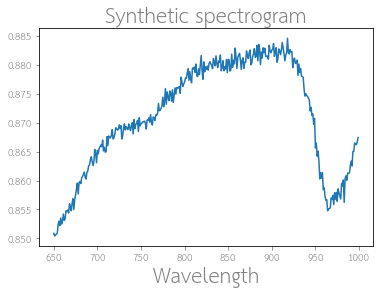

[0.0883404  0.00427964 0.00138753 0.00200975 0.00141336 0.00545877
 0.00846271 0.00056817 0.00166487]
(350,)
(350,)


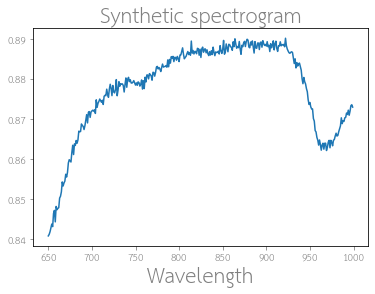

[0.04011294 0.00486079 0.00708072 0.0021116  0.00581841 0.00226714
 0.00955361 0.00909658 0.00370927]
(350,)
(350,)


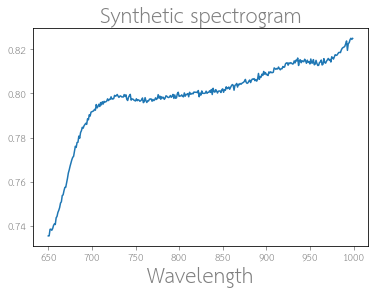

[3.09517931e-02 8.93938296e-03 2.50889663e-03 5.27960862e-03
 4.74075286e-03 3.17209009e-04 7.09078460e-05 8.92055480e-03
 1.69029936e-03]
(350,)
(350,)


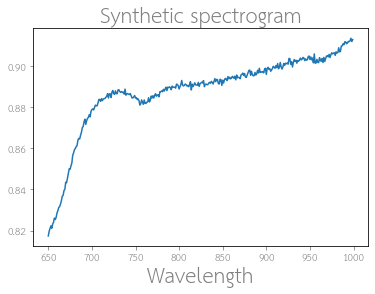

[0.07740824 0.00567069 0.0001373  0.00607219 0.00457065 0.00151129
 0.00300469 0.00422457 0.00587819]
(350,)
(350,)


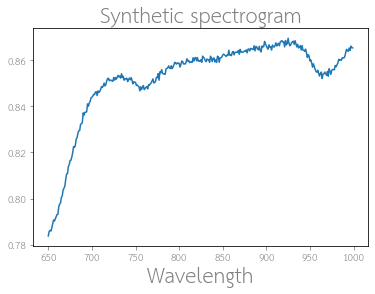

[0.0205587  0.00629997 0.00382368 0.00576351 0.0016386  0.00482672
 0.00240654 0.00017674 0.00330409]
(350,)
(350,)


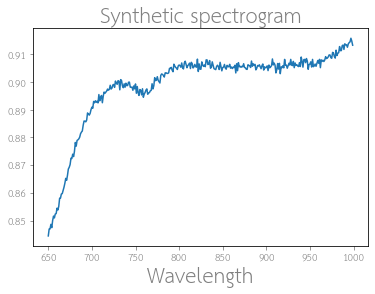

[0.04862893 0.00163512 0.00678708 0.00657815 0.00500089 0.00187345
 0.00464627 0.00630863 0.00241339]
(350,)
(350,)


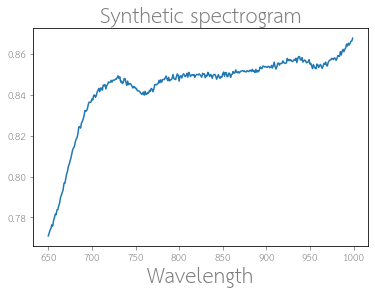

[0.02142176 0.00791253 0.00355888 0.00030899 0.0012008  0.00081071
 0.00062012 0.00778651 0.00129377]
(350,)
(350,)


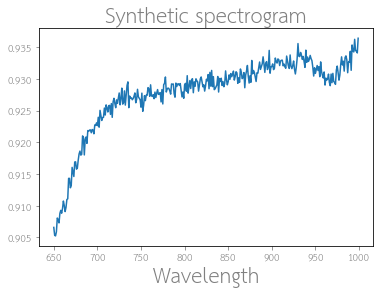

[0.06807029 0.00760838 0.00396235 0.00989586 0.00053864 0.00377669
 0.00814197 0.0099315  0.0092857 ]
(350,)
(350,)


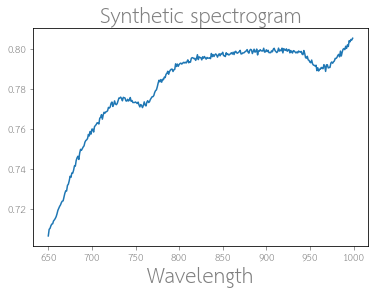

[0.07144987 0.00515473 0.00205033 0.00436461 0.00116786 0.0017088
 0.00738333 0.00636458 0.00842383]
(350,)
(350,)


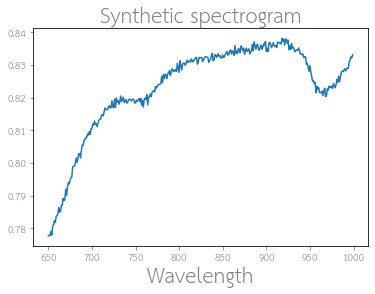

[0.05356704 0.0080816  0.00648414 0.00752719 0.00067044 0.00101785
 0.00714824 0.00348112 0.00282427]
(350,)
(350,)


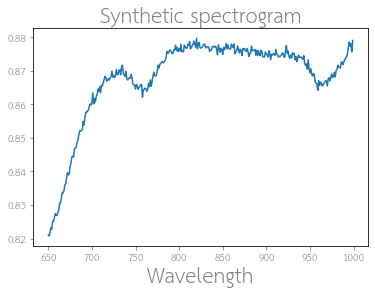

[0.04097356 0.00697416 0.00031171 0.00753401 0.00580622 0.00080213
 0.00951513 0.00575559 0.00110416]
(350,)
(350,)


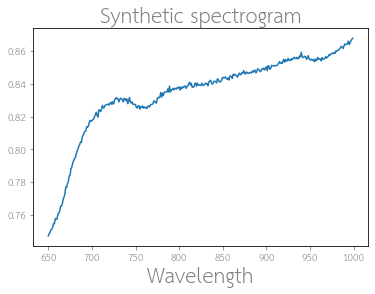

[0.06140689 0.00739509 0.00376899 0.00451261 0.00319207 0.00430201
 0.00519469 0.00107881 0.00998981]
(350,)
(350,)


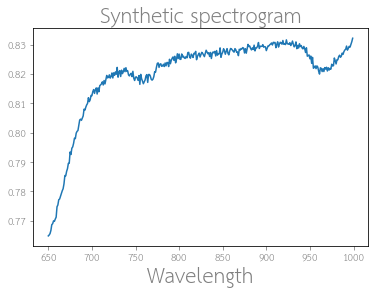

[0.08160012 0.00195059 0.00205504 0.00607276 0.00317973 0.00199476
 0.00192153 0.00430033 0.0076015 ]
(350,)
(350,)


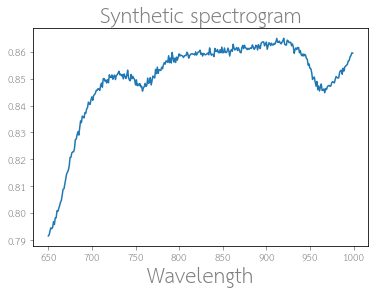

[1.08586380e-02 4.46294596e-04 3.37374225e-05 7.39286706e-03
 9.11380051e-04 6.19517987e-05 6.15101892e-03 9.58951656e-04
 1.35343267e-03]
(350,)
(350,)


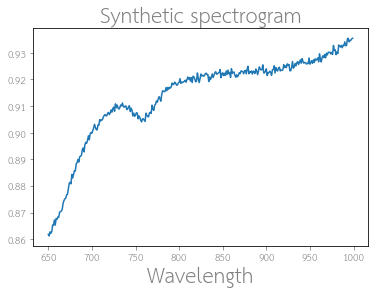

[0.0987745  0.00255781 0.00976984 0.00756792 0.00346342 0.00640166
 0.00384891 0.00153319 0.00800934]
(350,)
(350,)


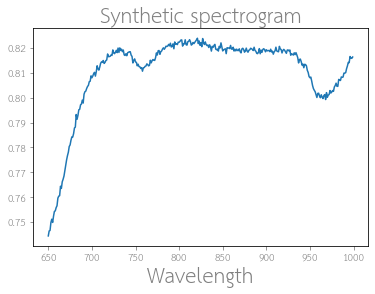

[0.01946116 0.00369018 0.0074785  0.00681976 0.0003613  0.00168193
 0.00631899 0.00274338 0.00144031]
(350,)
(350,)


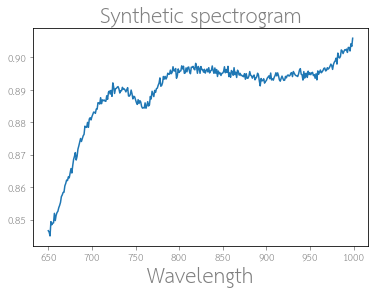

[0.04878781 0.00369097 0.00199856 0.0053203  0.00337673 0.00528109
 0.0075271  0.0081442  0.00302554]
(350,)
(350,)


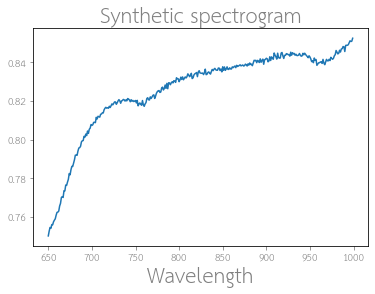

[0.02629622 0.00849825 0.00499341 0.00377128 0.00045917 0.00027191
 0.00639239 0.00319364 0.00742862]
(350,)
(350,)


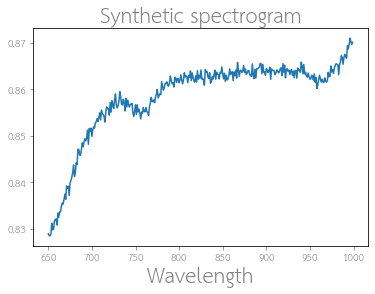

[0.08998369 0.00168975 0.00019712 0.00442095 0.00448333 0.0021448
 0.0079491  0.0047026  0.00832302]
(350,)
(350,)


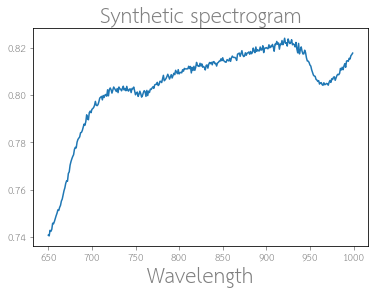

[8.26629833e-02 8.80317141e-03 5.71234032e-03 1.38379476e-03
 3.24471627e-04 6.54869316e-05 1.88248185e-03 3.09026975e-03
 1.75579545e-03]
(350,)
(350,)


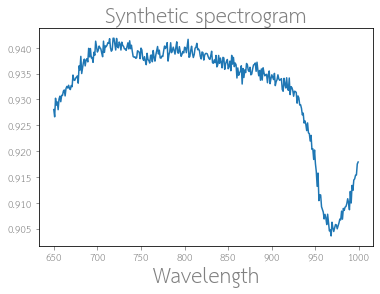

[0.05637162 0.00113791 0.00255176 0.00816067 0.00271251 0.00319575
 0.00756674 0.00063829 0.00856199]
(350,)
(350,)


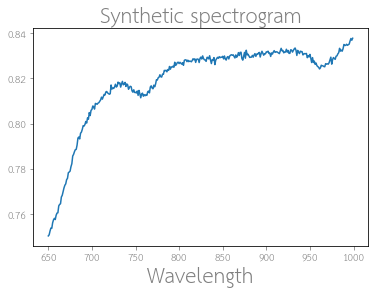

[2.55114030e-02 2.11500265e-04 4.12406595e-03 6.82897735e-03
 3.55650098e-03 3.04251627e-03 7.98544176e-05 6.57506695e-03
 6.04584278e-03]
(350,)
(350,)


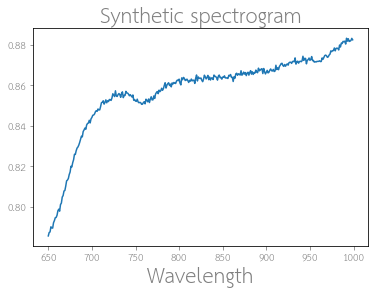

[0.00060359 0.00619019 0.00879409 0.00497797 0.0044807  0.00389239
 0.00469386 0.00565656 0.00913297]
(350,)
(350,)


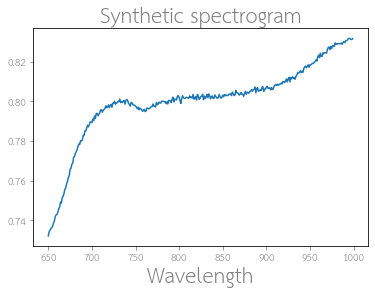

[5.55134439e-02 4.45544888e-03 4.29080399e-03 7.86956915e-03
 1.39532815e-05 8.60208148e-04 2.60110848e-03 6.00924071e-03
 8.89811956e-03]
(350,)
(350,)


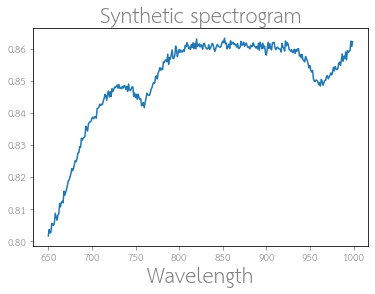

[9.84666265e-02 1.29653820e-03 8.91702181e-05 4.82397401e-03
 2.02335935e-04 8.30919643e-04 1.97848239e-06 8.05448839e-03
 1.01969563e-03]
(350,)
(350,)


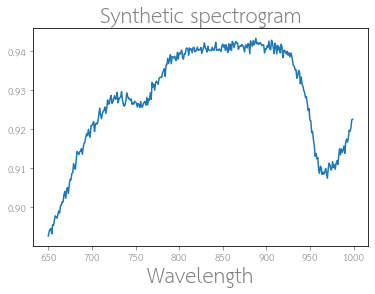

[0.09900827 0.0020605  0.00847004 0.00878382 0.00480382 0.00426414
 0.00943612 0.00486933 0.00928784]
(350,)
(350,)


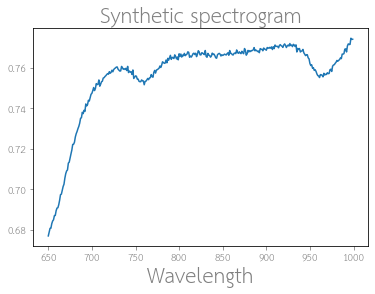

[0.07805558 0.00080915 0.00391811 0.00612919 0.00132721 0.00079888
 0.00305315 0.00628646 0.00039214]
(350,)
(350,)


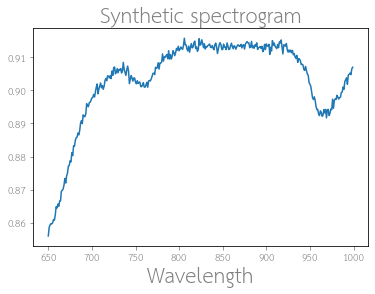

[0.08134598 0.00374114 0.0069032  0.00736032 0.00074861 0.00709566
 0.00046409 0.00298707 0.00314532]
(350,)
(350,)


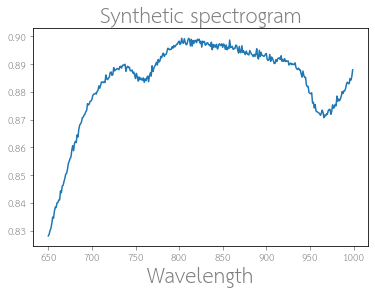

[0.06663024 0.00860087 0.00823529 0.00342394 0.00444151 0.00123778
 0.0034215  0.00518129 0.00559288]
(350,)
(350,)


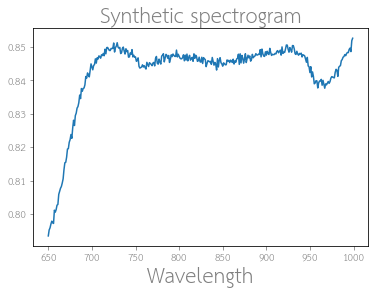

[0.08782025 0.00945944 0.0063232  0.00967417 0.00262261 0.00429035
 0.00129235 0.00958754 0.00266687]
(350,)
(350,)


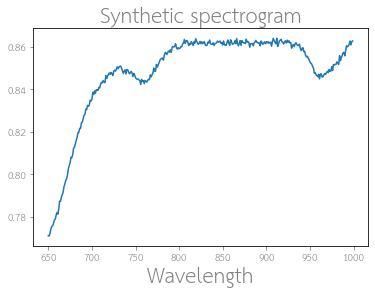

[0.08846735 0.00289318 0.00347858 0.00238243 0.00182661 0.0033055
 0.00195692 0.00726561 0.00856034]
(350,)
(350,)


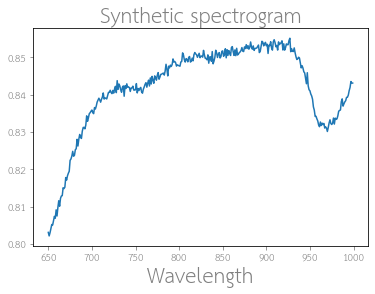

[0.00870686 0.00855983 0.00532426 0.00385428 0.00738996 0.00128785
 0.00101729 0.00781059 0.00193182]
(350,)
(350,)


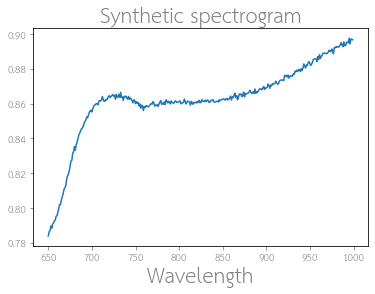

[0.09277775 0.00948787 0.00509165 0.00110989 0.00011373 0.00042875
 0.00443713 0.00259027 0.00923221]
(350,)
(350,)


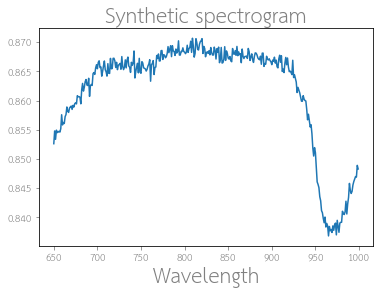

[1.60966538e-02 8.67154802e-03 8.23904251e-03 8.25983214e-03
 3.27898352e-05 7.14534954e-05 5.21951819e-03 3.76641277e-03
 2.13425500e-03]
(350,)
(350,)


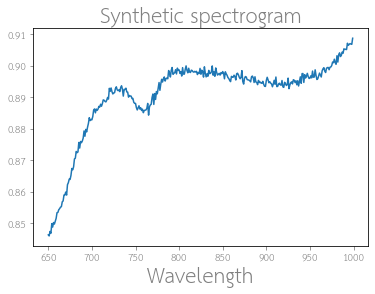

[0.0176975  0.001393   0.00892741 0.00400848 0.00148503 0.00331092
 0.00681703 0.00582633 0.00157473]
(350,)
(350,)


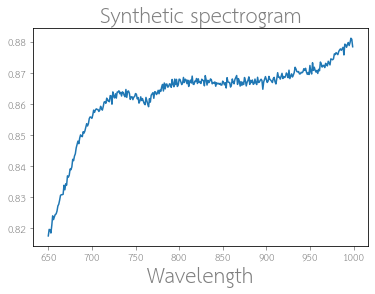

[0.06955706 0.00841    0.00475115 0.00468213 0.00089106 0.00485126
 0.00830378 0.00971469 0.00828944]
(350,)
(350,)


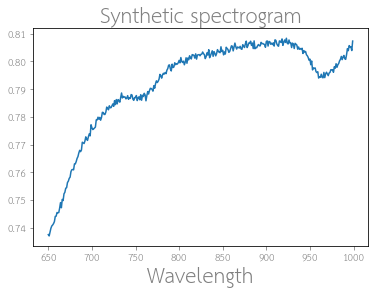

[3.90288629e-02 7.40436232e-03 1.27257979e-04 3.78468809e-03
 4.63935520e-05 7.22690714e-04 3.39184175e-03 9.43782009e-03
 3.00159983e-03]
(350,)
(350,)


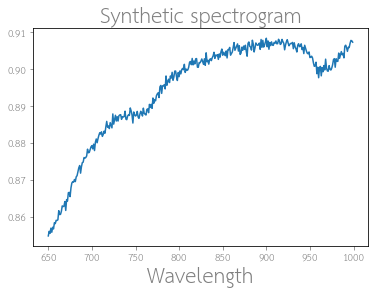

[0.02895899 0.00145666 0.00634406 0.00118693 0.00273495 0.00588849
 0.00714261 0.00373768 0.00766708]
(350,)
(350,)


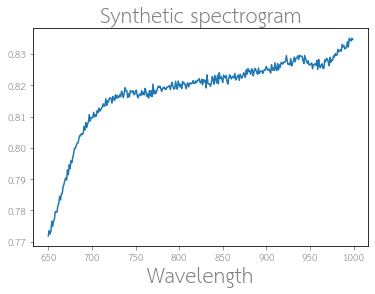

[0.05411207 0.00342352 0.00490441 0.00565093 0.00193649 0.00018673
 0.00982591 0.00465181 0.00416925]
(350,)
(350,)


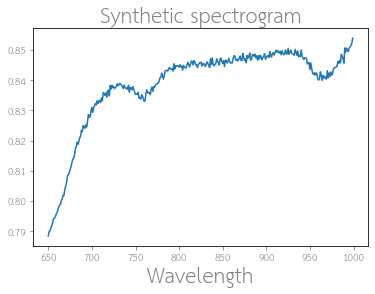

[0.06354737 0.0045309  0.00136319 0.00245824 0.00050561 0.00030972
 0.00205289 0.00786037 0.00661716]
(350,)
(350,)


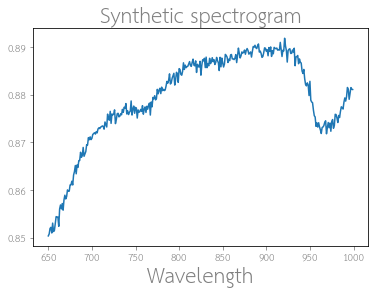

[8.79105475e-02 1.51724466e-04 2.93860326e-04 3.10081318e-03
 4.36703635e-03 2.91666185e-03 6.03650439e-05 2.42955709e-03
 8.55601777e-03]
(350,)
(350,)


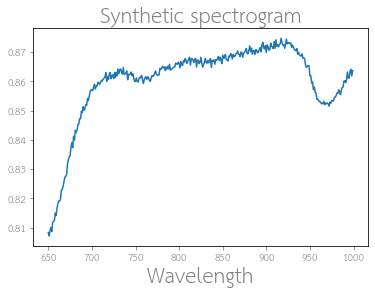

[5.38672506e-02 3.23050170e-03 9.87500868e-03 3.75341252e-05
 6.66093445e-03 3.90026775e-04 7.57747238e-03 6.64722815e-03
 3.77180694e-05]
(350,)
(350,)


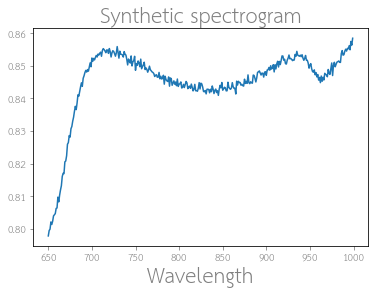

[0.05039861 0.00274443 0.00960477 0.00126597 0.00327444 0.0027171
 0.00789929 0.00333163 0.00336951]
(350,)
(350,)


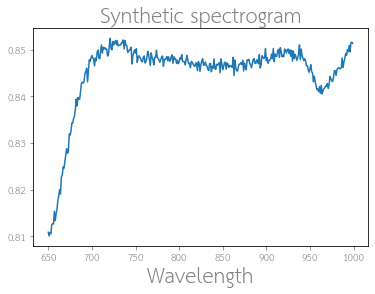

[0.06003778 0.00825456 0.00520042 0.0042758  0.00154895 0.00333733
 0.00512995 0.00574512 0.00370678]
(350,)
(350,)


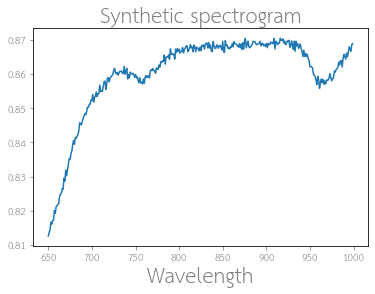

[0.07483924 0.00051424 0.00034714 0.00585167 0.00432632 0.00138186
 0.00328906 0.00480519 0.00993304]
(350,)
(350,)


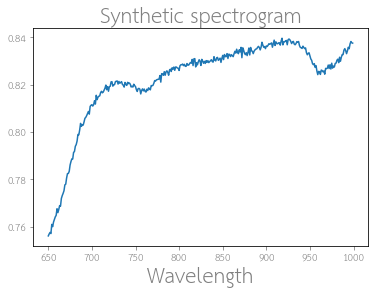

In [53]:
import os
x_loaded = np.load(path_s + 'x.npz')

for file in os.listdir(path_s + 'y_and_params/'):
    y_loaded = np.load(path_s + 'y_and_params/' + file)
    #print(np.max(y_loaded['spectra']),np.max(y_loaded['spectra']))
    print(y_loaded['params'])
    print(x_loaded['x'].shape)
    print(y_loaded['spectra'].shape)
    plt.plot(x_loaded['x'], y_loaded['spectra'])
    plt.xlabel("Wavelength", fontsize=20)
    plt.title("Synthetic spectrogram", fontsize=20)
    plt.show()

# Let us try PCA
Idea #1:
- collect tumor spectra and normal spectra from all Grade IV patients
- represent the spectra in a high dimensional space (number of dimensions = number of bands)
- run the PCA and get the weights for the first component
- check how much match between the first component and the absorption spectra

In [126]:
# DANGER: takes long time on a normal PC
# collect tumor, normal, blood spectra from the whole HELICoiD dataset

## Labels:
# 0 = indicates pixels that are not labelled,
# 1 = Normal Tissue, 
# 2 = Tumour Tissue, 
# 3 = Hypervascularized Tissue, 
# 4 = Background

gradeIVpatients = ["008-01"] #, "008-02"] #, "010-03", "012-01", "012-02", "014-01", "015-01", 
                  #"016-04", "016-05", "017-01", "020-01", "025-02"]


path = "/home/ivan/aimlab/HELICoiD/HSI_Human_Brain_Database_IEEE_Access/"

tumor = []
normal = []
blood = []

wavelength = np.linspace(450, 900, 826)

for patient in gradeIVpatients:
    
    
    gt_path = path + "{}/gtMap.hdr".format(patient)
    gt = open_image(gt_path)
    gt = gt.load()
    
    hdr_path = path + "{}/raw.hdr".format(patient)
    img = open_image(hdr_path) 
    
    
#     x_tumor, y_tumor = (gt.squeeze(-1)==2).nonzero() # selects pixels which labels belong to tumor class
    
#     for ix in range(len(x_tumor)): # loop over all tumor pixels
        
#         intensity = []
            
#         for ib in range(img.shape[-1]): # loop over the 3rd band dimension
#             intensity.append(img[x_tumor[ix],y_tumor[ix],ib][0][0][0])
        
#         tumor.append(intensity)
    
#     x_normal, y_normal = (gt.squeeze(-1)==1).nonzero() # selects pixels which labels belong to normal class
    
#     for ix in range(len(x_normal)): # loop over all tumor pixels

#         intensity = []

#         for ib in range(img.shape[-1]): # loop over the 3rd band dimension
#             intensity.append(img[x_normal[ix],y_normal[ix],ib][0][0][0])

#         normal.append(intensity)
        
    x_blood, y_blood = (gt.squeeze(-1)==3).nonzero() # selects pixels which labels belong to blood class
        
    for ix in range(len(x_blood)): # loop over all tumor pixels

        intensity = []

        for ib in range(img.shape[-1]): # loop over the 3rd band dimension
            intensity.append(img[x_blood[ix],y_blood[ix],ib][0][0][0])

        blood.append(intensity)

np.savez_compressed("pca_tumor_normal", tumor=tumor, normal=normal, blood=blood)


In [127]:
len(blood)

1331

(450, 900)

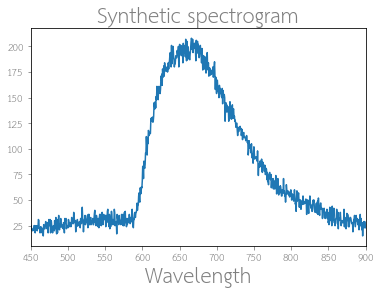

In [128]:
### Visualising synthetic spectrogram
plt.plot(wavelength, blood[1200])
plt.xlabel("Wavelength", fontsize=20)
plt.title("Synthetic spectrogram", fontsize=20)
plt.xlim(450, 900)
#ax.set_ylim(0, 10)

In [132]:
import os
tumor = np.load('pca_tumor_normal.npz')['tumor']
normal = np.load('pca_tumor_normal.npz')['normal']
blood = np.load('pca_tumor_normal.npz')['blood']
print(tumor.shape,normal.shape,blood.shape)

# for i in range(len(tumor)):
    
#     plt.plot(wavelength, tumor[i])
#     plt.xlabel("Wavelength", fontsize=20)
#     plt.title("Synthetic spectrogram", fontsize=20)
#     plt.show()

(12275, 826) (53659, 826) (29004, 826)
